# Interpretation

### Setup

In [1]:
from pathlib import Path
import sys

ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "pyproject.toml").exists())
sys.path.insert(0, str(ROOT))

In [2]:
import gc
import json
import os
import re
import time

from catboost import CatBoostRegressor, Pool
from dotenv import load_dotenv
import lightgbm as lgb
import matplotlib.pyplot as plt
import mlflow
import numpy as np
import polars as pl
from scipy.special import ndtri
import shap
import torch
from torch import nn
import xgboost as xgb

DATA = ROOT / "data"
MODELS = ROOT / "models"
ARCHIVE = ROOT / "archive"
REFERENCE = ARCHIVE / "reference"
SUBS = ROOT / "submissions"
SETUP = DATA / "setup"
FEAT = DATA / "features"
SEQ = DATA / "seq"
MEMBER_DIR = MODELS / "members"
COMBINER_DIR = MODELS / "combiner"
FIGS = ROOT / "reports" / "interpret"
FIGS.mkdir(parents=True, exist_ok=True)

DEV = "cuda" if torch.cuda.is_available() else "cpu"
N_SHAP = 3000
SHAP_BUDGET_S = 300.0
SEED = 42
RNG = np.random.default_rng(SEED)
plt.rcParams["figure.dpi"] = 600
plt.rcParams["figure.autolayout"] = True

VPS_IP = "2.26.27.187"
EXPERIMENT = "ecup-prod"
load_dotenv(ROOT / ".env")
mlflow.set_tracking_uri(os.environ.get("MLFLOW_TRACKING_URI", f"https://{VPS_IP}"))
mlflow.set_experiment(EXPERIMENT)
print(DEV, torch.cuda.get_device_name(0) if DEV == "cuda" else "")

cuda NVIDIA GeForce RTX 4090


### Artifacts

In [3]:
CONFIG = json.loads((SETUP / "config.json").read_text())
SUBMIT = CONFIG["submit_anchor"]
ANCHORS = CONFIG["train_anchors"]
N_USERS = CONFIG["n_users"]
HORIZON_DAYS = CONFIG["horizon_days"]
USER_IDS = np.load(SETUP / "user_ids.npy")
COHORT = np.load(SETUP / "cohort.npy")
TARGETS = np.load(SETUP / "targets.npy")
ACTIVE_NEXT = np.load(SETUP / "active_next.npy")
LEVELS = json.loads((SETUP / "levels.json").read_text())
SUBMIT_MASK = COHORT[-1]
ANCHOR_IDX = {a: i for i, a in enumerate(ANCHORS)}

VAL_ANCHORS = [
    "2025-09-24",
    "2025-10-08",
    "2025-10-22",
    "2025-12-03",
    "2025-12-17",
    "2025-12-31",
    "2026-01-14",
]
FIT_ANCHORS = ["2025-09-24", "2025-10-08", "2025-10-22", "2025-12-03"]
EVAL_ANCHORS = ["2025-12-17", "2025-12-31", "2026-01-14"]

SPEC = json.loads((COMBINER_DIR / "members.json").read_text())
MEMBER_ORDER = SPEC["members"]
KEPT_MEMBERS = SPEC["kept"]
NNLS = {s: json.loads((COMBINER_DIR / f"nnls_{s}.json").read_text()) for s in ("kept", "all")}
MEMBER_CV = {n: json.loads((MEMBER_DIR / n / "cv.json").read_text()) for n in MEMBER_ORDER}

print(
    f"{len(MEMBER_ORDER)} members, {len(KEPT_MEMBERS)} kept, cohort {SUBMIT_MASK.sum()} at {SUBMIT}"
)
print(", ".join(KEPT_MEMBERS))

34 members, 11 kept, cohort 250000 at 2026-02-13
cat_a_sp, cat_b, catf_b_sp, catf_f, catf_f_sp, seq_b, seq_c, v3_mlp, v3_seq, xgb_a, xgbf_a_sp


### Context

In [4]:
NAMES_X = json.loads((FEAT / "names_x.json").read_text())
NAMES_E_FULL = json.loads((FEAT / "names_e.json").read_text())
NAMES_F = json.loads((FEAT / "names_f.json").read_text())
KEEP_IDX = np.load(FEAT / "keep_idx.npy")
BASE_NAMES = [NAMES_X[j] for j in KEEP_IDX] + NAMES_E_FULL
FEATURE_NAMES = BASE_NAMES + NAMES_F
N_BASE = len(BASE_NAMES)
N_FEAT = len(FEATURE_NAMES)
COL_IDX = {n: i for i, n in enumerate(FEATURE_NAMES)}
CAP_COLS = [
    "days_since_last_order",
    "days_since_last_cart",
    "tenure_days",
    "days_since_first_order",
]
CAP_AT = 180.0
CAP_IDX = np.array([BASE_NAMES.index(c) for c in CAP_COLS])

X445 = np.asarray(np.load(FEAT / "x" / f"X_{SUBMIT}.npy", mmap_mode="r"))[:, KEEP_IDX]
X445 = np.concatenate(
    [X445, np.asarray(np.load(FEAT / "e" / f"E_{SUBMIT}.npy", mmap_mode="r"))], axis=1
)
X445[:, CAP_IDX] = np.minimum(X445[:, CAP_IDX], CAP_AT)
X445 = np.concatenate(
    [X445, np.asarray(np.load(FEAT / "f" / f"F_{SUBMIT}.npy", mmap_mode="r"))], axis=1
)
RG445 = np.asarray(np.load(FEAT / "rg" / f"RG_{SUBMIT}.npy", mmap_mode="r"))
print("X445", X445.shape, X445.dtype, " RG445", RG445.shape, RG445.dtype)

X445 (250000, 445) float32  RG445 (250000, 445) float16


### Feature families

In [5]:
FAMILY_RULES = [
    ("rank", r"^rank_"),
    ("block30", r"^blk_"),
    ("week", r"^wk_"),
    ("dow", r"^dow_"),
    ("order_stats", r"^os_"),
    ("streak", r"^streak_"),
    ("last_order", r"^last_order_loggmv|^prev_order_loggmv|^days_since_order_"),
    ("recency", r"^days_since|^tenure_days$|^recency_over_gap$|^last_order_gap$|_recency_"),
    ("ewm", r"^ewm_"),
    ("trend", r"_trend_|_slope_|_ratio_\d|_m2$|_m3$|_vs_yearly_rate$|last_over_mean|_gt_last$"),
    ("intensity", r"^basket_|_per_order|_per_active|_rate_\d|^order_gap|^active_gap"),
    ("mix", r"_share_|^search_only|^cat_only|^both_ch|^neither_ch|^cart_to_ord|^search_to_cart_\d"),
    ("dispersion", r"_std_|_sd_|^gmv_max"),
    ("window_sum", r"_sum_\d+d$"),
]
FAMILY = np.array(
    [next((f for f, p in FAMILY_RULES if re.search(p, n)), "other") for n in FEATURE_NAMES]
)
FAM_NAMES = sorted(set(FAMILY))
FAM_MASK = {f: np.equal(FAMILY, f) for f in FAM_NAMES}
print(f"{'family':<13}{'cols':>5}   example")
for f in FAM_NAMES:
    idx = np.flatnonzero(FAM_MASK[f])
    print(f"{f:<13}{len(idx):>5}   {', '.join(FEATURE_NAMES[i] for i in idx[:3])}")

family        cols   example
block30         62   blk_lgmv_0, blk_lgmv_1, blk_lgmv_2
dispersion      10   gmv_std_30d, gmv_std_90d, gmv_max_7d
dow             18   dow_ord_0, dow_ord_1, dow_ord_2
ewm             72   ewm_gmv_3, ewm_gmv_7, ewm_gmv_14
intensity       21   order_gap_365d, active_gap_90d, gmv_per_active_30d
last_order       5   days_since_order_3, days_since_order_5, days_since_order_10
mix             44   cart_to_ord_30d, search_to_cart_30d, cat_gmv_share_30d
order_stats     14   os_n_orders, os_gap_mean, os_gap_sd
rank            20   rank_gmv_sum_30d, rank_gmv_sum_90d, rank_gmv_sum_365d
recency         10   days_since_last_event, days_since_last_order, days_since_last_cart
streak           4   streak_inactive_now, streak_active_max_90, streak_inactive_max_90
trend           30   loggmv_slope_90d, loggmv_slope_365d, gmv_trend_7_30
week            30   wk_act_0, wk_act_1, wk_act_2
window_sum     105   gmv_sum_7d, gmv_sum_14d, gmv_sum_30d


### Members

In [6]:
SEED_POOL = [42, 7, 2024, 555, 31337, 101, 202, 303, 909, 1234, 5678, 4242, 777, 1111, 2222, 3333]
RG_KINDS = ("mlp", "mlpce", "tabm", "mlpord")
MODEL_EXT = {
    "cat": "cbm",
    "xgb": "ubj",
    "lgb": "txt",
    "mlp": "pt",
    "mlpce": "pt",
    "mlpord": "pt",
    "mlpv3": "pt",
    "tabm": "pt",
    "seq": "pt",
    "seq2": "pt",
}
SEQ_ARCH = {
    "v3_seq": {
        "patch": 8,
        "n_patch": 22,
        "dim": 192,
        "layers": 6,
        "heads": 6,
        "ff": 2,
        "valid": False,
        "side": "v3",
        "pool13": False,
        "side_hidden": 256,
        "head_hidden": 256,
        "final_norm": True,
    },
    "seq_b": {
        "patch": 7,
        "n_patch": 52,
        "dim": 256,
        "layers": 6,
        "heads": 8,
        "ff": 3,
        "valid": True,
        "side": "all",
        "pool13": True,
        "side_hidden": 512,
        "head_hidden": 512,
        "final_norm": True,
    },
}
SEQ2_ARCH = {
    "patch": 7,
    "n_patch": 52,
    "dim": 256,
    "layers": 6,
    "heads": 8,
    "ff": 3,
    "side_hidden": 512,
    "head_hidden": 512,
    "final_norm": True,
}
V3_SIDE_COLS = [
    "days_since_last_event",
    "days_since_last_order",
    "days_since_last_cart",
    "tenure_days",
    "active_rate_30d",
    "active_rate_90d",
    "order_day_rate_30d",
    "loggmv_per_order_365d",
    "ewm_loggmv_60",
    "ewm_has_order_60",
    "gmv_trend_7_30",
    "gmv_trend_30_90",
]
MEMBERS = {
    "catf_a": {"kind": "cat", "v4": True, "iters": 1000, "lr": 0.03, "depth": 8, "l2": 30.0},
    "catf_b": {"kind": "cat", "v4": True, "iters": 1500, "lr": 0.03, "depth": 6, "l2": 6.0},
    "catf_d": {"kind": "cat", "v4": False, "iters": 1500, "lr": 0.03, "depth": 8, "l2": 100.0},
    "catf_f": {
        "kind": "cat",
        "v4": True,
        "iters": 1200,
        "lr": 0.03,
        "depth": 10,
        "l2": 30.0,
        "grow": "lossguide",
    },
    "cat_a": {"kind": "cat", "v4": True, "iters": 3000, "lr": 0.03, "depth": 8},
    "cat_b": {"kind": "cat", "v4": True, "iters": 5000, "lr": 0.02, "depth": 10, "l2": 12.0},
    "xgbf_a": {"kind": "xgb", "v4": True, "rounds": 150, "depth": 9, "n_sub": 8},
    "xgbf_b": {"kind": "xgb", "v4": False, "rounds": 250, "depth": 8, "n_sub": 8},
    "xgb_a": {"kind": "xgb", "v4": True, "rounds": 2500, "depth": 9},
    "lgbf_a": {"kind": "lgb", "v4": False, "rounds": 150, "leaves": 255, "n_sub": 6},
    "lgbf_b": {"kind": "lgb", "v4": True, "rounds": 250, "leaves": 127, "n_sub": 6},
    "lgb_a": {"kind": "lgb", "v4": False, "rounds": 2500, "leaves": 255},
    "mlpf_a": {"kind": "mlp", "v4": True, "width": 2560, "drop": 0.35, "n_sub": 16},
    "mlpf_b": {"kind": "mlp", "v4": False, "width": 1536, "drop": 0.2, "n_sub": 16},
    "mlpf_c": {"kind": "mlpce", "v4": True, "width": 1536, "n_sub": 16},
    "mlpf_d": {"kind": "mlp", "v4": True, "width": 1024, "drop": 0.35, "n_sub": 16},
    "mlpf_o": {"kind": "mlpord", "v4": True, "width": 1536, "n_sub": 16},
    "tabm_a": {
        "kind": "tabm",
        "v4": True,
        "width": 512,
        "blocks": 3,
        "k": 32,
        "drop": 0.1,
        "ple": False,
        "n_sub": 6,
    },
    "tabm_b": {
        "kind": "tabm",
        "v4": False,
        "width": 512,
        "blocks": 3,
        "k": 32,
        "drop": 0.1,
        "ple": True,
        "n_sub": 4,
    },
    "v3_cat": {"kind": "cat", "v4": False, "iters": 3000, "lr": 0.03, "depth": 8, "n_sub": 3},
    "v3_cat2": {"kind": "cat", "v4": False, "iters": 5000, "lr": 0.02, "depth": 10, "n_sub": 3},
    "v3_mlp": {"kind": "mlpv3", "v4": False, "width": 1024, "drop": 0.15, "n_sub": 3},
    "v3_seq": {"kind": "seq", "v4": False, "n_sub": 2},
    "seq_b": {"kind": "seq", "v4": False, "n_sub": 3},
    "seq_c": {"kind": "seq2", "v4": False, "n_sub": 3},
}
for m in ("catf_d", "catf_b", "xgbf_a", "catf_f", "xgbf_b", "catf_a", "lgbf_b", "lgbf_a", "cat_a"):
    MEMBERS[f"{m}_sp"] = {**MEMBERS[m]}
for cfg in MEMBERS.values():
    cfg.setdefault("n_sub", 3)
KIND = {n: MEMBERS[n]["kind"] for n in MEMBER_ORDER}
TREE_MEMBERS = [n for n in MEMBER_ORDER if KIND[n] in ("cat", "xgb", "lgb")]
NN_MEMBERS = [n for n in MEMBER_ORDER if KIND[n] in ("mlp", "mlpce", "mlpord", "mlpv3", "tabm")]
SEQ_MEMBERS = [n for n in MEMBER_ORDER if KIND[n] in ("seq", "seq2")]
SIDE_IDX = {"all": np.arange(N_BASE)}
SIDE_IDX["v3"] = np.array(
    [BASE_NAMES.index(c) for c in [n for n in BASE_NAMES if n.startswith("rank_")] + V3_SIDE_COLS]
)
N_CAL = 7
DAILY_META = {t: json.loads((SEQ / f"{t}_meta.json").read_text()) for t in ("daily9", "daily10")}
CAL_NP = np.load(SEQ / "calendar.npy")
DATE_MIN = np.datetime64(CONFIG["date_min"])
ANCHOR_T_SUBMIT = int((np.datetime64(SUBMIT) - DATE_MIN) / np.timedelta64(1, "D"))
print(f"{len(TREE_MEMBERS)} tree, {len(NN_MEMBERS)} tabular nn, {len(SEQ_MEMBERS)} sequence")

23 tree, 8 tabular nn, 3 sequence


### Torch modules

In [7]:
TABM_K, PLE_BINS, PLE_DIM = 32, 8, 8
HL_LO, HL_HI, HL_BINS = -2.8, 9.2, 48
HL_EDGES = np.linspace(HL_LO, HL_HI, HL_BINS + 1)
HL_CENTERS = 0.5 * (HL_EDGES[:-1] + HL_EDGES[1:])
HL_SIGMA = 0.75 * (HL_EDGES[1] - HL_EDGES[0])
ORD_LO, ORD_HI, ORD_BINS = -2.8, 9.2, 32
ORD_EDGES = np.linspace(ORD_LO, ORD_HI, ORD_BINS + 1)
ORD_CENTERS = 0.5 * (ORD_EDGES[:-1] + ORD_EDGES[1:])


class LinearBE(nn.Module):
    def __init__(self, d_in, d_out, k, first):
        super().__init__()
        self.weight = nn.Parameter(torch.empty(d_in, d_out))
        nn.init.kaiming_uniform_(self.weight, a=5**0.5)
        sign = torch.randint(0, 2, (k, d_in), dtype=torch.float32) * 2.0 - 1.0
        self.r = nn.Parameter(sign if first else torch.ones(k, d_in))
        self.s = nn.Parameter(torch.ones(k, d_out))
        self.bias = nn.Parameter(torch.zeros(k, d_out))

    def forward(self, x):
        return ((x * self.r) @ self.weight) * self.s + self.bias


class PLE(nn.Module):
    def __init__(self, edges):
        super().__init__()
        d, n_edge = edges.shape
        t_bins = n_edge - 1
        self.register_buffer("lo", edges[:, :-1].contiguous())
        self.register_buffer("width", (edges[:, 1:] - edges[:, :-1]).clamp_min(1e-6))
        self.weight = nn.Parameter(torch.randn(d, t_bins, PLE_DIM) * (1.0 / t_bins**0.5))
        self.bias = nn.Parameter(torch.zeros(d, PLE_DIM))
        self.out_dim = d * PLE_DIM

    def forward(self, x):
        t = ((x[..., None] - self.lo) / self.width).clamp(0.0, 1.0)
        return (torch.einsum("bdt,dte->bde", t, self.weight) + self.bias).flatten(1)


class TabM(nn.Module):
    def __init__(self, d_in, k, width, blocks, drop, n_out, edges=None):
        super().__init__()
        self.k = k
        self.emb = PLE(edges) if edges is not None else None
        d = self.emb.out_dim if self.emb is not None else d_in
        self.layers = nn.ModuleList(
            [LinearBE(d if i == 0 else width, width, k, i == 0) for i in range(blocks)]
        )
        self.drop = nn.Dropout(drop)
        self.head = LinearBE(width, n_out, k, False)

    def forward(self, x):
        if self.emb is not None:
            x = self.emb(x)
        h = x[:, None].expand(-1, self.k, -1)
        for lin in self.layers:
            h = self.drop(nn.functional.gelu(lin(h)))
        return self.head(h)


class Seq(nn.Module):
    def __init__(self, arch, n_side, n_ch):
        super().__init__()
        dim = arch["dim"]
        self.valid = bool(arch["valid"])
        self.pool13 = bool(arch["pool13"])
        n_extra = 2 if self.valid else 1
        n_pool = 5 if self.pool13 else 4
        self.proj = nn.Linear(2 * n_ch + n_extra, dim)
        self.pos = nn.Parameter(torch.zeros(1, arch["n_patch"], dim))
        layer = nn.TransformerEncoderLayer(
            dim,
            arch["heads"],
            dim_feedforward=arch["ff"] * dim,
            dropout=0.1,
            activation="gelu",
            batch_first=True,
            norm_first=True,
        )
        self.enc = nn.TransformerEncoder(
            layer, arch["layers"], norm=nn.LayerNorm(dim) if arch["final_norm"] else None
        )
        self.attn = nn.Linear(dim, 1)
        side_layers = [nn.Linear(n_side, arch["side_hidden"]), nn.GELU()]
        if self.valid:
            side_layers.append(nn.Dropout(0.15))
        side_layers.append(nn.Linear(arch["side_hidden"], dim))
        self.side = nn.Sequential(*side_layers)
        self.head = nn.Sequential(
            nn.Linear(n_pool * dim, arch["head_hidden"]),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(arch["head_hidden"], 2),
        )

    def forward(self, seq, side):
        h = self.enc(self.proj(seq) + self.pos)
        w = torch.softmax(self.attn(h), dim=1)
        pooled = [h[:, -1], h[:, -4:].mean(1)]
        if self.pool13:
            pooled.append(h[:, -13:].mean(1))
        pooled += [(h * w).sum(1), self.side(side)]
        o = self.head(torch.cat(pooled, dim=1))
        return o[:, 0], o[:, 1]


class Encoder(nn.Module):
    def __init__(self, arch, n_feat):
        super().__init__()
        dim = arch["dim"]
        self.proj = nn.Linear(n_feat, dim)
        self.pos = nn.Parameter(torch.zeros(1, arch["n_patch"], dim))
        self.mask_token = nn.Parameter(torch.zeros(1, 1, dim))
        layer = nn.TransformerEncoderLayer(
            dim,
            arch["heads"],
            dim_feedforward=arch["ff"] * dim,
            dropout=0.1,
            activation="gelu",
            batch_first=True,
            norm_first=True,
        )
        self.enc = nn.TransformerEncoder(
            layer, arch["layers"], norm=nn.LayerNorm(dim) if arch["final_norm"] else None
        )

    def forward(self, seq, mask=None):
        h = self.proj(seq)
        if mask is not None:
            h = torch.where(mask.unsqueeze(-1), self.mask_token.expand_as(h), h)
        return self.enc(h + self.pos)


class SeqNet(nn.Module):
    def __init__(self, arch, n_feat, n_side):
        super().__init__()
        dim = arch["dim"]
        self.encoder = Encoder(arch, n_feat)
        self.attn = nn.Linear(dim, 1)
        self.side = nn.Sequential(
            nn.Linear(n_side, arch["side_hidden"]),
            nn.GELU(),
            nn.Dropout(0.15),
            nn.Linear(arch["side_hidden"], dim),
        )
        self.head = nn.Sequential(
            nn.Linear(5 * dim, arch["head_hidden"]),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(arch["head_hidden"], 2),
        )

    def forward(self, seq, side):
        h = self.encoder(seq)
        w = torch.softmax(self.attn(h), dim=1)
        pooled = [h[:, -1], h[:, -4:].mean(1), h[:, -13:].mean(1), (h * w).sum(1), self.side(side)]
        o = self.head(torch.cat(pooled, dim=1))
        return o[:, 0], o[:, 1]

### Blend

In [8]:
RAW_SUB = {n: np.load(MEMBER_DIR / n / "sub.npy").astype(np.float64) for n in MEMBER_ORDER}
SD_SUB = {n: float(RAW_SUB[n].std()) for n in MEMBER_ORDER}
MU_SUB = {n: float(RAW_SUB[n].mean()) for n in MEMBER_ORDER}
M_SUB = np.column_stack([(RAW_SUB[n] - MU_SUB[n]) / SD_SUB[n] for n in MEMBER_ORDER])

LZ, NL_Z, BOOST_F = {}, {}, {}
for scope, family, fname in (
    ("kept", "lgbm", "v46_lgbm_residual.txt"),
    ("all", "xgb", "v47_xgb_residual.ubj"),
):
    cols = np.array(NNLS[scope]["columns"])
    w = np.array(NNLS[scope]["weights"], dtype=np.float64)
    z = M_SUB[:, cols]
    lz = z @ w
    xs = np.column_stack([z, lz])
    if family == "lgbm":
        f = lgb.Booster(model_file=str(COMBINER_DIR / fname)).predict(xs)
    else:
        booster = xgb.Booster()
        booster.load_model(str(COMBINER_DIR / fname))
        f = booster.predict(xgb.DMatrix(xs))
    LZ[scope] = lz
    BOOST_F[scope] = np.asarray(f)
    p = lz + f
    NL_Z[scope] = (p - p.mean()) / p.std()
    print(
        f"{scope:>5} lin sd {lz.std():.5f}  boost sd {f.std():.5f}  corr {np.corrcoef(p, lz)[0, 1]:.6f}"
    )

W_TOTAL = 5.368096
TARGET_MEAN = 2.3312
NL_BETA = {"kept": 1.6276200554303766, "all": 1.6275976097615987}
PRED_GMV = {}
for scope in ("kept", "all"):
    lo, hi = -30.0, 30.0
    for _ in range(200):
        mid = 0.5 * (lo + hi)
        if float(np.clip(NL_BETA[scope] * NL_Z[scope] + mid, 0.0, None).mean()) < TARGET_MEAN:
            lo = mid
        else:
            hi = mid
    PRED_GMV[scope] = np.expm1(np.clip(NL_BETA[scope] * NL_Z[scope] + 0.5 * (lo + hi), 0.0, None))
    print(f"{scope:>5} zeros {(PRED_GMV[scope] == 0).mean():.3%}  max {PRED_GMV[scope].max():,.0f}")

W_KEPT = np.zeros(len(MEMBER_ORDER))
W_KEPT[np.array(NNLS["kept"]["columns"])] = np.array(NNLS["kept"]["weights"])
GAIN = {n: W_KEPT[i] / SD_SUB[n] for i, n in enumerate(MEMBER_ORDER)}

 kept lin sd 0.67414  boost sd 0.00693  corr 0.999947
  all lin sd 0.67414  boost sd 0.00727  corr 0.999942
 kept zeros 0.235%  max 5,750
  all zeros 0.257%  max 5,715


### Out of fold panel

In [9]:
OOF_Z, OOF_Y, OOF_LZ, OOF_RAW = {}, {}, {}, {}
for a in VAL_ANCHORS:
    m = COHORT[ANCHOR_IDX[a]]
    cols = []
    for n in MEMBER_ORDER:
        raw = np.load(MEMBER_DIR / n / f"oof_{a}.npy").astype(np.float64)[m]
        cols.append((raw - raw.mean()) / raw.std())
    OOF_Z[a] = np.column_stack(cols)
    y = np.log1p(TARGETS[ANCHOR_IDX[a]][m])
    OOF_Y[a] = y
    OOF_LZ[a] = OOF_Z[a] @ W_KEPT
    OOF_RAW[a] = m

OOF_PR, OOF_FIT = {}, {}
print(
    f"{'anchor':<12}{'n':>8}{'rho':>9}{'beta':>8}{'level':>8}{'rmsle fit':>11}{'rmsle sd match':>16}{'held out':>10}"
)
for a in VAL_ANCHORS:
    z = (OOF_LZ[a] - OOF_LZ[a].mean()) / OOF_LZ[a].std()
    y = OOF_Y[a]
    beta, level = np.polyfit(z, y, 1)
    OOF_PR[a] = np.clip(beta * z + level, 0.0, None)
    OOF_FIT[a] = (float(beta), float(level))
    sd_match = np.clip(z * y.std() + y.mean(), 0.0, None)
    print(
        f"{a:<12}{len(y):>8}{float(np.corrcoef(z, y)[0, 1]):>9.5f}{beta:>8.4f}{level:>8.4f}"
        f"{np.sqrt(((OOF_PR[a] - y) ** 2).mean()):>11.5f}"
        f"{np.sqrt(((sd_match - y) ** 2).mean()):>16.5f}"
        f"{'yes' if a in EVAL_ANCHORS else 'no':>10}"
    )
print(f"\nshipped beta at the submit anchor {NL_BETA['kept']:.5f}")

anchor             n      rho    beta   level  rmsle fit  rmsle sd match  held out
2025-09-24    213189  0.67151  1.5830  2.4912    1.74685         1.87750        no
2025-10-08    216169  0.67203  1.5760  2.4772    1.73657         1.86784        no
2025-10-22    219591  0.67416  1.5785  2.4961    1.72933         1.86037        no
2025-12-03    233135  0.68004  1.6234  2.6072    1.75021         1.88421        no
2025-12-17    240066  0.67486  1.5888  2.4509    1.73734         1.86526       yes
2025-12-31    239500  0.67547  1.5515  2.2837    1.69375         1.80550       yes
2026-01-14    244983  0.68381  1.5663  2.2694    1.67126         1.77917       yes

shipped beta at the submit anchor 1.62762


### Member geometry

In [10]:
C = np.corrcoef(M_SUB.T)
ev = np.linalg.eigvalsh(C)[::-1]
eff_rank = float(np.exp(-(ev / ev.sum() * np.log(ev / ev.sum())).sum()))
uniq = {}
for i, n in enumerate(MEMBER_ORDER):
    other = np.delete(np.arange(len(MEMBER_ORDER)), i)
    coef, *_ = np.linalg.lstsq(M_SUB[:, other], M_SUB[:, i], rcond=None)
    uniq[n] = float(((M_SUB[:, other] @ coef - M_SUB[:, i]) ** 2).mean())

corr_blend = {
    n: float(np.corrcoef(M_SUB[:, i], LZ["kept"])[0, 1]) for i, n in enumerate(MEMBER_ORDER)
}
print(f"top eigenvalue {ev[0]:.2f} of {len(ev)}   participation rank {eff_rank:.2f}")
print(f"{'member':<12}{'kind':>7}{'cv':>9}{'w':>9}{'gain':>8}{'corr blend':>12}{'unique var':>12}")
for n in sorted(MEMBER_ORDER, key=lambda k: -W_KEPT[MEMBER_ORDER.index(k)]):
    i = MEMBER_ORDER.index(n)
    print(
        f"{n:<12}{KIND[n]:>7}{MEMBER_CV[n]['POOLED_ALL']:>9.5f}{W_KEPT[i]:>9.5f}"
        f"{GAIN[n]:>8.4f}{corr_blend[n]:>12.5f}{uniq[n]:>12.5f}"
    )

top eigenvalue 33.88 of 34   participation rank 1.03
member         kind       cv        w    gain  corr blend  unique var
seq_c          seq2  1.72520  0.15953  0.1014     0.99903     0.00208
seq_b           seq  1.72757  0.11633  0.0736     0.99761     0.00522
catf_b_sp       cat  1.72479  0.11426  0.0727     0.99871     0.00027
v3_mlp        mlpv3  1.73439  0.06501  0.0399     0.99066     0.01731
cat_a_sp        cat  1.72494  0.06014  0.0382     0.99889     0.00049
xgbf_a_sp       xgb  1.72559  0.04654  0.0302     0.99834     0.00027
catf_f          cat  1.72712  0.03204  0.0202     0.99805     0.00133
xgb_a           xgb  1.73210  0.03131  0.0196     0.99582     0.00295
v3_seq          seq  1.72627  0.02379  0.0152     0.99719     0.00481
catf_f_sp       cat  1.72623  0.01397  0.0088     0.99843     0.00129
cat_b           cat  1.72672  0.01287  0.0081     0.99807     0.00103
cat_a           cat  1.72582  0.00000  0.0000     0.99859     0.00049
catf_a          cat  1.72518  0.00000

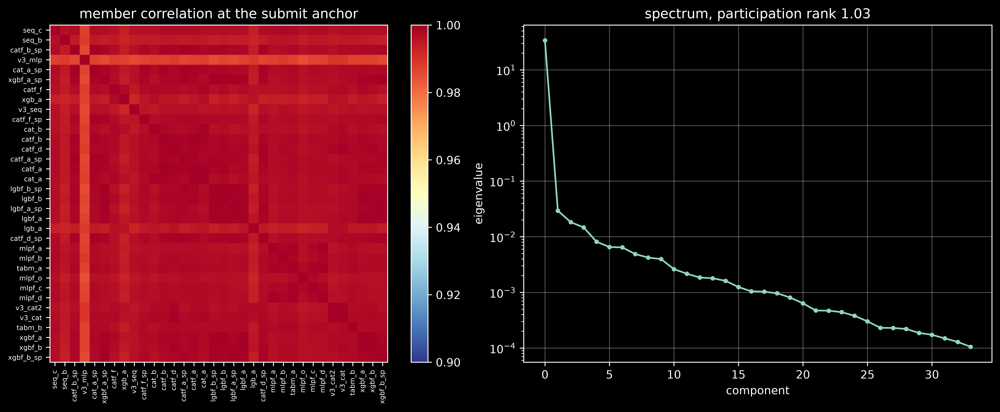

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(13, 5.2))
order = np.argsort([-W_KEPT[i] for i in range(len(MEMBER_ORDER))])
im = ax[0].imshow(C[np.ix_(order, order)], cmap="RdYlBu_r", vmin=0.9, vmax=1.0)
ax[0].set_xticks(range(len(order)), [MEMBER_ORDER[i] for i in order], rotation=90, fontsize=6)
ax[0].set_yticks(range(len(order)), [MEMBER_ORDER[i] for i in order], fontsize=6)
ax[0].set_title("member correlation at the submit anchor")
fig.colorbar(im, ax=ax[0], fraction=0.046)
ax[1].semilogy(ev, "o-", ms=3)
ax[1].set_xlabel("component")
ax[1].set_ylabel("eigenvalue")
ax[1].set_title(f"spectrum, participation rank {eff_rank:.2f}")
ax[1].grid(alpha=0.3)
fig.savefig(FIGS / "member_geometry.png")
plt.show()

### Sample

In [12]:
POOL = np.flatnonzero(SUBMIT_MASK)
SAMP = np.sort(RNG.choice(POOL, size=N_SHAP, replace=False))
g30 = X445[:, COL_IDX["gmv_sum_30d"]]
g365 = X445[:, COL_IDX["gmv_sum_365d"]]
ord365 = X445[:, COL_IDX["has_order_sum_365d"]]
rec = X445[:, COL_IDX["days_since_last_order"]]
act30 = X445[:, COL_IDX["active_sum_30d"]]
sea30 = X445[:, COL_IDX["searches_sum_30d"]]
ten = X445[:, COL_IDX["tenure_days"]]
zlz = (LZ["kept"] - LZ["kept"].mean()) / LZ["kept"].std()

SEGMENTS = {
    "whale": g365 >= np.quantile(g365, 0.99),
    "regular": (ord365 >= 6) & (rec <= 30),
    "lapsing": (ord365 >= 3) & (rec >= 90),
    "never_ordered": ord365 == 0,
    "search_only_no_order": (ord365 == 0) & (sea30 >= np.quantile(sea30[sea30 > 0], 0.5)),
    "reactivated": (rec <= 14) & (X445[:, COL_IDX["days_since_prev_order"]] >= 90),
    "thin_history": ten <= 90,
    "barely_active": act30 <= 2,
    "cart_no_order": (X445[:, COL_IDX["has_cart_sum_90d"]] > 0)
    & (X445[:, COL_IDX["has_order_sum_90d"]] == 0),
    "single_order": ord365 == 1,
}
print(f"cohort minimum activity in the last 30 days: {act30.min():.0f}")
print(f"{'segment':<22}{'users':>9}{'share':>8}{'mean z':>9}{'mean gmv':>11}")
for s, m in SEGMENTS.items():
    print(
        f"{s:<22}{m.sum():>9}{m.mean():>8.2%}{zlz[m].mean():>9.3f}{PRED_GMV['kept'][m].mean():>11.1f}"
    )

CASES = {}
for s, m in SEGMENTS.items():
    idx = np.flatnonzero(m)
    if len(idx) == 0:
        continue
    CASES[s] = int(idx[np.argsort(np.abs(zlz[idx] - np.median(zlz[idx])))[0]])
CASES["top_prediction"] = int(np.argmax(zlz))
CASES["bottom_prediction"] = int(np.argmin(zlz))
CASES["max_member_spread"] = int(np.argmax(M_SUB.std(axis=1)))
SAMP = np.unique(np.concatenate([SAMP, np.array(sorted(CASES.values()))]))
CASE_ROW = {k: int(np.searchsorted(SAMP, v)) for k, v in CASES.items()}
print(f"\nattribution panel {len(SAMP)} users, {len(CASES)} named cases")
for k, v in CASES.items():
    print(f"  {k:<22}user {USER_IDS[v]:<8} z {zlz[v]:+.3f}  gmv {PRED_GMV['kept'][v]:>9.1f}")

XS = np.ascontiguousarray(X445[SAMP])
RGS = np.ascontiguousarray(RG445[SAMP].astype(np.float32))
NS = len(SAMP)

cohort minimum activity in the last 30 days: 1
segment                   users   share   mean z   mean gmv
whale                      2500   1.00%    2.432      721.7
regular                  119082  47.63%    0.816       82.6
lapsing                   14751   5.90%   -0.776        2.2
never_ordered             31971  12.79%   -1.264        0.3
search_only_no_order       6309   2.52%   -1.269        0.3
reactivated                5229   2.09%   -0.507        4.3
thin_history               5173   2.07%   -0.848        6.2
barely_active             32739  13.10%   -0.922        2.4
cart_no_order             46276  18.51%   -1.073        1.0
single_order              16709   6.68%   -1.012        1.1

attribution panel 3013 users, 13 named cases
  whale                 user 381410   z +2.541  gmv     618.9
  regular               user 272608   z +0.765  gmv      35.3
  lapsing               user 362133   z -0.813  gmv       1.7
  never_ordered         user 147723   z -1.269  gmv       0.3

### Tree shap

In [13]:
SHAP_MODE, SHAP_M = {}, {}
probe_rows = np.ascontiguousarray(XS[:100])
for name in TREE_MEMBERS:
    if KIND[name] != "cat":
        SHAP_MODE[name] = "exact"
        continue
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    b = CatBoostRegressor()
    b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.cbm"))
    t0 = time.time()
    b.get_feature_importance(Pool(probe_rows[:, :nc]), type="ShapValues", thread_count=16)
    rate = (time.time() - t0) / len(probe_rows)
    fits = rate * NS <= SHAP_BUDGET_S or MEMBERS[name].get("grow") == "lossguide"
    SHAP_MODE[name] = "exact" if fits else "approximate"
    print(
        f"{name:<12}{rate * 1000:>8.1f} ms/row  projected {rate * NS:>7.0f}s  -> {SHAP_MODE[name]}",
        flush=True,
    )
    del b

check = [n for n in TREE_MEMBERS if SHAP_MODE.get(n) == "approximate"]
print(f"\n{'member':<12}{'global pearson':>16}{'global spearman':>17}{'top 25 overlap':>16}")
for name in check:
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    b = CatBoostRegressor()
    b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.cbm"))
    xs = np.ascontiguousarray(XS[:400, :nc])
    ap = np.abs(
        b.get_feature_importance(
            Pool(xs), type="ShapValues", shap_calc_type="Approximate", thread_count=16
        )[:, :-1]
    ).mean(axis=0)
    ex = np.abs(
        b.get_feature_importance(
            Pool(xs), type="ShapValues", shap_calc_type="Regular", thread_count=16
        )[:, :-1]
    ).mean(axis=0)
    ov = len(set(np.argsort(-ap)[:25].tolist()) & set(np.argsort(-ex)[:25].tolist()))
    ra, re_ = np.argsort(np.argsort(-ap)), np.argsort(np.argsort(-ex))
    print(
        f"{name:<12}{np.corrcoef(ap, ex)[0, 1]:>16.5f}{np.corrcoef(ra, re_)[0, 1]:>17.5f}{ov:>14}/25"
    )
    del b

cat_a           31.5 ms/row  projected      95s  -> exact
cat_a_sp        31.2 ms/row  projected      94s  -> exact
cat_b          254.0 ms/row  projected     765s  -> approximate
catf_a           9.4 ms/row  projected      28s  -> exact
catf_a_sp        9.5 ms/row  projected      29s  -> exact
catf_b           1.9 ms/row  projected       6s  -> exact
catf_b_sp        1.9 ms/row  projected       6s  -> exact
catf_d          13.5 ms/row  projected      41s  -> exact
catf_d_sp       13.8 ms/row  projected      42s  -> exact
catf_f          15.8 ms/row  projected      48s  -> exact
catf_f_sp       16.2 ms/row  projected      49s  -> exact
v3_cat          28.2 ms/row  projected      85s  -> exact
v3_cat2        238.2 ms/row  projected     718s  -> approximate

member        global pearson  global spearman  top 25 overlap
cat_b                0.93749          0.97327            23/25
v3_cat2              0.92897          0.96576            22/25


In [14]:
t_all = time.time()
for name in TREE_MEMBERS:
    t0 = time.time()
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    xs = np.ascontiguousarray(XS[:, :nc])
    kind = KIND[name]
    if kind == "cat":
        b = CatBoostRegressor()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.cbm"))
        sv = b.get_feature_importance(
            Pool(xs),
            type="ShapValues",
            shap_calc_type="Regular" if SHAP_MODE[name] == "exact" else "Approximate",
            thread_count=16,
        )
    elif kind == "xgb":
        b = xgb.Booster()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.ubj"))
        sv = b.predict(xgb.DMatrix(xs), pred_contribs=True)
    else:
        b = lgb.Booster(model_file=str(MEMBER_DIR / name / f"sub_{SEED}.txt"))
        sv = np.asarray(b.predict(xs, pred_contrib=True))
    full = np.zeros((NS, N_FEAT + 1))
    full[:, :nc] = sv[:, :-1]
    full[:, -1] = sv[:, -1]
    SHAP_M[name] = full
    print(f"{name:<12}{nc:>5} cols  {SHAP_MODE[name]:<12}{time.time() - t0:>7.1f}s", flush=True)
    del b, sv
    gc.collect()
print(f"tree shap {time.time() - t_all:.0f}s")

cat_a         445 cols  exact           7.9s
cat_a_sp      445 cols  exact           7.9s
cat_b         445 cols  approximate     2.3s
catf_a        445 cols  exact           2.6s
catf_a_sp     445 cols  exact           2.6s
catf_b        445 cols  exact           0.3s
catf_b_sp     445 cols  exact           0.3s
catf_d        317 cols  exact           4.1s
catf_d_sp     317 cols  exact           3.8s
catf_f        445 cols  exact          49.1s
catf_f_sp     445 cols  exact          49.8s
lgb_a         317 cols  exact         178.9s
lgbf_a        317 cols  exact           5.8s
lgbf_a_sp     317 cols  exact           5.3s
lgbf_b        445 cols  exact           3.5s
lgbf_b_sp     445 cols  exact           3.3s
v3_cat        317 cols  exact           7.5s
v3_cat2       317 cols  approximate     2.3s
xgb_a         445 cols  exact           8.7s
xgbf_a        445 cols  exact           0.7s
xgbf_a_sp     445 cols  exact           0.7s
xgbf_b        317 cols  exact           0.6s
xgbf_b_sp 

In [15]:
print(f"{'member':<12}{'sum check':>12}  top features")
for name in TREE_MEMBERS:
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    xs = np.ascontiguousarray(XS[:, :nc])
    kind = KIND[name]
    if kind == "cat":
        b = CatBoostRegressor()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.cbm"))
        pred = np.asarray(b.predict(xs))
    elif kind == "xgb":
        b = xgb.Booster()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.ubj"))
        pred = np.asarray(b.inplace_predict(xs))
    else:
        b = lgb.Booster(model_file=str(MEMBER_DIR / name / f"sub_{SEED}.txt"))
        pred = np.asarray(b.predict(xs))
    err = float(np.abs(SHAP_M[name].sum(axis=1) - pred).max())
    imp = np.abs(SHAP_M[name][:, :N_FEAT]).mean(axis=0)
    print(f"{name:<12}{err:>12.2e}  {', '.join(FEATURE_NAMES[i] for i in np.argsort(-imp)[:5])}")
    del b

member         sum check  top features
cat_a           1.33e-15  rank_ewm_loggmv_60, ewm_loggmv_60, ewm_logsearches_3, rank_ewm_loggmv_120, ewm_loggmv_120
cat_a_sp        8.88e-16  rank_ewm_loggmv_60, rank_to_ord_sum_365d, ewm_loggmv_60, ewm_loggmv_per_order_240, ewm_logsearches_3
cat_b           1.78e-15  blk_has_0, ewm_loggmv_60, to_ord_sum_365d, loggmv_per_active_365d, ewm_logsearches_3
catf_a          8.88e-16  rank_ewm_loggmv_60, ewm_loggmv_60, ewm_logsearches_3, ewm_loggmv_120, rank_ewm_loggmv_120
catf_a_sp       8.88e-16  rank_ewm_loggmv_60, ewm_loggmv_60, rank_to_ord_sum_365d, rank_ewm_loggmv_120, ewm_logsearches_3
catf_b          8.88e-16  rank_ewm_loggmv_120, rank_ewm_loggmv_60, ewm_loggmv_60, ewm_logsearches_3, ewm_loggmv_per_order_240
catf_b_sp       1.33e-15  rank_ewm_loggmv_60, ewm_loggmv_60, rank_ewm_loggmv_120, rank_ewm_logto_ord_60, ewm_logsearches_3
catf_d          8.88e-16  rank_ewm_loggmv_120, rank_ewm_loggmv_60, ewm_loggmv_60, order_pos_sd_365d, ewm_logsearches_3
c

### Sequence panel

In [16]:
DAILY_MM = {t: np.load(SEQ / f"{t}_f16.npy", mmap_mode="r") for t in ("daily9", "daily10")}
CAL_T = torch.from_numpy(CAL_NP).to(DEV)


def seq_panel(rows, arch, tag, is_seq2):
    patch, n_patch = int(arch["patch"]), int(arch["n_patch"])
    context_len = patch * n_patch
    lo_d = ANCHOR_T_SUBMIT - context_len + 1
    n_ch = len(DAILY_META[tag]["channels"])
    win = (
        torch.from_numpy(np.ascontiguousarray(DAILY_MM[tag][rows, lo_d : ANCHOR_T_SUBMIT + 1]))
        .to(DEV)
        .float()
    )
    win = win.view(len(rows), n_patch, patch, n_ch)
    valid = torch.ones(len(rows), n_patch, 1, device=DEV)
    if is_seq2:
        cnt = (win[:, :, :, -1] > 0).float().sum(dim=2, keepdim=True) / patch
        content = torch.cat([win.sum(dim=2), win.amax(dim=2), cnt], dim=2)
        cpatch = (
            CAL_T[lo_d : ANCHOR_T_SUBMIT + 1]
            .view(n_patch, patch, -1)
            .mean(dim=1)
            .unsqueeze(0)
            .expand(len(rows), -1, -1)
        )
        return torch.cat([content, valid, cpatch], dim=2)
    cnt = (win[:, :, :, -1] > 0).float().sum(dim=2, keepdim=True)
    parts = [win.sum(dim=2), win.amax(dim=2), cnt]
    if bool(arch["valid"]):
        parts.append(valid)
    return torch.cat(parts, dim=2)


SEQ_CFG = {}
for name in SEQ_MEMBERS:
    is_seq2 = KIND[name] == "seq2"
    arch = SEQ2_ARCH if is_seq2 else SEQ_ARCH[name]
    tag = "daily10" if is_seq2 else "daily9"
    side_idx = SIDE_IDX["all"] if is_seq2 else SIDE_IDX[str(arch["side"])]
    n_ch = len(DAILY_META[tag]["channels"])
    SEQ_CFG[name] = {
        "arch": arch,
        "tag": tag,
        "is_seq2": is_seq2,
        "side_idx": side_idx,
        "n_ch": n_ch,
        "patch": int(arch["patch"]),
        "n_patch": int(arch["n_patch"]),
        "pool13": is_seq2 or bool(arch["pool13"]),
        "n_feat": 2 * n_ch + 1 + 1 + N_CAL if is_seq2 else 2 * n_ch + (2 if arch["valid"] else 1),
        "channels": [f"sum_{c}" for c in DAILY_META[tag]["channels"]]
        + [f"max_{c}" for c in DAILY_META[tag]["channels"]]
        + ["count"]
        + (
            [
                "valid",
                "cal_index",
                "cal_dow_sin",
                "cal_dow_cos",
                "cal_doy_sin",
                "cal_doy_cos",
                "cal_trend",
                "cal_one",
            ]
            if is_seq2
            else (["valid"] if arch["valid"] else [])
        ),
    }
    print(
        f"{name:<9}{tag:<9}patch {arch['patch']:>2} x {arch['n_patch']:>2}  n_feat {SEQ_CFG[name]['n_feat']:>3}  side {len(side_idx):>3}"
    )


def seq_mu(net, s, side):
    return net(s, side)[0]


def load_member(name, seed):
    kind = KIND[name]
    cfg = MEMBERS[name]
    path = MEMBER_DIR / name / f"sub_{seed}.{MODEL_EXT[kind]}"
    if kind in ("seq", "seq2"):
        sc = SEQ_CFG[name]
        net = (
            SeqNet(sc["arch"], sc["n_feat"], len(sc["side_idx"]))
            if sc["is_seq2"]
            else Seq(sc["arch"], len(sc["side_idx"]), sc["n_ch"])
        ).to(DEV)
        net.load_state_dict(torch.load(path, map_location=DEV))
        return net.eval()
    d_in = 445 if cfg["v4"] else N_BASE
    if kind == "tabm":
        edges = torch.zeros(d_in, PLE_BINS + 1, device=DEV) if cfg["ple"] else None
        model = TabM(d_in, cfg["k"], cfg["width"], cfg["blocks"], cfg["drop"], 2, edges).to(DEV)
    else:
        width = cfg["width"]
        n_out = {"mlp": 3, "mlpce": HL_BINS, "mlpord": ORD_BINS - 1, "mlpv3": 2}[kind]
        model = nn.ModuleDict(
            {
                "body": nn.Sequential(
                    nn.Linear(d_in, width),
                    nn.BatchNorm1d(width),
                    nn.GELU(),
                    nn.Dropout(cfg.get("drop", 0.2)),
                    nn.Linear(width, width // 2),
                    nn.BatchNorm1d(width // 2),
                    nn.GELU(),
                    nn.Dropout(cfg.get("drop", 0.2)),
                    nn.Linear(width // 2, 256),
                    nn.BatchNorm1d(256),
                    nn.GELU(),
                ),
                "skip": nn.Linear(d_in, 256),
                "head": nn.Linear(256, n_out),
            }
        ).to(DEV)
    model.load_state_dict(torch.load(path, map_location=DEV))
    return model.eval()


HL_C = torch.tensor(HL_CENTERS, dtype=torch.float32, device=DEV)
ORD_C = torch.tensor(ORD_CENTERS, dtype=torch.float32, device=DEV)


def nn_scalar(model, kind, xb):
    if kind == "tabm":
        return model(xb)[:, :, 0].mean(dim=1)
    o = model["head"](model["body"](xb) + model["skip"](xb))
    if kind == "mlpce":
        return torch.softmax(o, dim=1) @ HL_C
    if kind == "mlpord":
        p = torch.sigmoid(o)
        surv = torch.cat([torch.ones_like(p[:, :1]), torch.cumprod(p, dim=1)], dim=1)
        nxt = torch.cat([torch.cumprod(p, dim=1), torch.zeros_like(p[:, :1])], dim=1)
        prob = surv - nxt
        return prob / prob.sum(dim=1, keepdim=True).clamp_min(1e-8) @ ORD_C
    return o[:, 0]

seq_b    daily9   patch  7 x 52  n_feat  20  side 317
seq_c    daily10  patch  7 x 52  n_feat  29  side 317
v3_seq   daily9   patch  8 x 22  n_feat  19  side  32


### Fidelity

In [17]:
RG_S = torch.from_numpy(RGS).to(DEV)
SIDE_S = torch.from_numpy(np.ascontiguousarray(RG445[SAMP].astype(np.float32))).to(DEV)
SEQ_S = {
    n: seq_panel(SAMP, SEQ_CFG[n]["arch"], SEQ_CFG[n]["tag"], SEQ_CFG[n]["is_seq2"])
    for n in SEQ_MEMBERS
}
PRED1 = {}
for name in MEMBER_ORDER:
    kind = KIND[name]
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    if kind == "cat":
        b = CatBoostRegressor()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.cbm"))
        PRED1[name] = np.asarray(b.predict(np.ascontiguousarray(XS[:, :nc])))
    elif kind == "xgb":
        b = xgb.Booster()
        b.load_model(str(MEMBER_DIR / name / f"sub_{SEED}.ubj"))
        PRED1[name] = np.asarray(b.inplace_predict(np.ascontiguousarray(XS[:, :nc])))
    elif kind == "lgb":
        b = lgb.Booster(model_file=str(MEMBER_DIR / name / f"sub_{SEED}.txt"))
        PRED1[name] = np.asarray(b.predict(np.ascontiguousarray(XS[:, :nc])))
    elif kind in ("seq", "seq2"):
        net = load_member(name, SEED)
        sc = SEQ_CFG[name]
        outs = []
        with torch.no_grad():
            for k in range(0, NS, 2048):
                mu, _ = net(SEQ_S[name][k : k + 2048], SIDE_S[k : k + 2048, sc["side_idx"]])
                outs.append(mu.float().cpu().numpy())
        PRED1[name] = np.concatenate(outs)
        del net
        torch.cuda.empty_cache()
    else:
        model = load_member(name, SEED)
        outs = []
        with torch.no_grad():
            for k in range(0, NS, 8192):
                outs.append(nn_scalar(model, kind, RG_S[k : k + 8192, :nc]).float().cpu().numpy())
        PRED1[name] = np.concatenate(outs)
        del model
        torch.cuda.empty_cache()

Z1 = np.column_stack([(PRED1[n] - MU_SUB[n]) / SD_SUB[n] for n in MEMBER_ORDER])
LZ1 = Z1 @ W_KEPT
print(f"{'member':<12}{'seeds':>6}{'corr vs seed avg':>18}{'sd ratio':>10}")
for n in MEMBER_ORDER:
    r = float(np.corrcoef(PRED1[n], RAW_SUB[n][SAMP])[0, 1])
    print(
        f"{n:<12}{MEMBERS[n]['n_sub']:>6}{r:>18.5f}{PRED1[n].std() / RAW_SUB[n][SAMP].std():>10.4f}"
    )
print(
    f"\nblend from one seed vs shipped blend  corr {np.corrcoef(LZ1, LZ['kept'][SAMP])[0, 1]:.6f}"
)

/tmp/ipykernel_570543/505703147.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(
/tmp/ipykernel_570543/505703147.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


member       seeds  corr vs seed avg  sd ratio
cat_a            3           0.99970    0.9994
cat_a_sp         3           0.99976    1.0005
cat_b            3           0.99960    1.0007
catf_a           3           0.99986    1.0002
catf_a_sp        3           0.99989    0.9997
catf_b           3           0.99987    0.9993
catf_b_sp        3           0.99990    1.0001
catf_d           3           0.99987    1.0001
catf_d_sp        3           0.99989    0.9995
catf_f           3           0.99936    1.0027
catf_f_sp        3           0.99950    1.0012
lgb_a            3           0.99858    0.9995
lgbf_a           6           0.99975    0.9994
lgbf_a_sp        6           0.99975    1.0008
lgbf_b           6           0.99987    0.9993
lgbf_b_sp        6           0.99987    1.0001
mlpf_a          16           0.99984    0.9970
mlpf_b          16           0.99985    0.9972
mlpf_c          16           0.99982    1.0016
mlpf_d          16           0.99984    0.9999
mlpf_o       

### Neural attribution

In [18]:
from functools import partial

from captum.attr import IntegratedGradients

IG_STEPS = 64
IG_BATCH = 2048
IG_BATCH_SEQ = 256
ATTR_M = {}
torch.cuda.empty_cache()
for name in NN_MEMBERS:
    t0 = time.time()
    kind = KIND[name]
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    model = load_member(name, SEED)
    ig = IntegratedGradients(partial(nn_scalar, model, kind))
    chunks = []
    for k in range(0, NS, 512):
        xb = RG_S[k : k + 512, :nc].clone().requires_grad_(True)
        a = ig.attribute(
            xb,
            baselines=torch.zeros_like(xb),
            n_steps=IG_STEPS,
            internal_batch_size=IG_BATCH,
        )
        chunks.append(a.detach().float().cpu().numpy())
    a = np.concatenate(chunks)
    full = np.zeros((NS, N_FEAT + 1))
    full[:, :nc] = a
    with torch.no_grad():
        base = float(nn_scalar(model, kind, torch.zeros(2, nc, device=DEV))[0])
    full[:, -1] = base
    ATTR_M[name] = full
    err = float(np.abs(full.sum(axis=1) - PRED1[name]).max())
    print(f"{name:<12}{time.time() - t0:>7.1f}s  completeness gap {err:.4f}", flush=True)
    del model, ig
    torch.cuda.empty_cache()
    gc.collect()

mlpf_a          3.5s  completeness gap 0.0000
mlpf_b          3.0s  completeness gap 0.0000
mlpf_c          4.4s  completeness gap 0.0000
mlpf_d          3.3s  completeness gap 0.0000
mlpf_o          5.8s  completeness gap 0.0000
tabm_a          5.2s  completeness gap 0.0000
tabm_b          5.4s  completeness gap 0.0416
v3_mlp          2.9s  completeness gap 0.0000


### Sequence attribution

In [19]:
SEQ_ATTR, SEQ_SIDE_ATTR = {}, {}
torch.cuda.empty_cache()
for name in SEQ_MEMBERS:
    t0 = time.time()
    sc = SEQ_CFG[name]
    net = load_member(name, SEED)
    ig = IntegratedGradients(partial(seq_mu, net))
    a_seq, a_side = [], []
    for k in range(0, NS, 256):
        s = SEQ_S[name][k : k + 256].clone().requires_grad_(True)
        sd = SIDE_S[k : k + 256, sc["side_idx"]].clone().requires_grad_(True)
        at = ig.attribute(
            (s, sd),
            baselines=(torch.zeros_like(s), torch.zeros_like(sd)),
            n_steps=IG_STEPS,
            internal_batch_size=IG_BATCH_SEQ,
        )
        a_seq.append(at[0].detach().float().cpu().numpy())
        a_side.append(at[1].detach().float().cpu().numpy())
    SEQ_ATTR[name] = np.concatenate(a_seq)
    full = np.zeros((NS, N_FEAT + 1))
    full[:, sc["side_idx"]] = np.concatenate(a_side)
    with torch.no_grad():
        z = torch.zeros(2, *SEQ_S[name].shape[1:], device=DEV)
        zs = torch.zeros(2, len(sc["side_idx"]), device=DEV)
        full[:, -1] = float(net(z, zs)[0][0])
    SEQ_SIDE_ATTR[name] = full
    tot = SEQ_ATTR[name].sum(axis=(1, 2)) + full.sum(axis=1)
    print(
        f"{name:<9}{time.time() - t0:>7.1f}s  seq {SEQ_ATTR[name].shape}  "
        f"completeness gap {np.abs(tot - PRED1[name]).max():.4f}",
        flush=True,
    )
    del net, ig
    torch.cuda.empty_cache()
    gc.collect()

for name in SEQ_MEMBERS:
    ATTR_M[name] = SEQ_SIDE_ATTR[name]
    print(
        f"{name:<9}tensor term sd {SEQ_ATTR[name].sum(axis=(1, 2)).std():.4f}  side term sd {SEQ_SIDE_ATTR[name][:, :N_FEAT].sum(axis=1).std():.4f}"
    )

/tmp/ipykernel_570543/505703147.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_b       17.5s  seq (3013, 52, 20)  completeness gap 0.6270


/tmp/ipykernel_570543/505703147.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_c       16.9s  seq (3013, 52, 29)  completeness gap 0.0281
v3_seq      11.8s  seq (3013, 22, 19)  completeness gap 0.1224
seq_b    tensor term sd 0.6824  side term sd 0.9762
seq_c    tensor term sd 0.5570  side term sd 1.0661
v3_seq   tensor term sd 0.2766  side term sd 1.4149


### Ensemble attribution

In [20]:
ATTR_ALL = {**SHAP_M, **ATTR_M}
ENS = np.zeros((NS, N_FEAT))
ENS_T = np.zeros(NS)
ENS_BASE = 0.0
for i, n in enumerate(MEMBER_ORDER):
    if W_KEPT[i] <= 0:
        continue
    ENS += GAIN[n] * ATTR_ALL[n][:, :N_FEAT]
    ENS_BASE += GAIN[n] * (ATTR_ALL[n][:, N_FEAT].mean() - MU_SUB[n])
    if n in SEQ_MEMBERS:
        ENS_T += GAIN[n] * SEQ_ATTR[n].sum(axis=(1, 2))
recon = ENS.sum(axis=1) + ENS_T + ENS_BASE
print(
    f"blend reconstruction  corr {np.corrcoef(recon, LZ1)[0, 1]:.7f}  max abs gap {np.abs(recon - LZ1).max():.5f}"
)
print(f"blend sd {LZ1.std():.5f}  reconstruction sd {recon.std():.5f}")
print(f"tensor term sd {ENS_T.std():.5f}  named column term sd {ENS.sum(axis=1).std():.5f}")

COLS_ALL = [*FEATURE_NAMES, "daily_tensor"]
FAM_ALL = np.array([*FAMILY.tolist(), "daily_tensor"])
ENS_A = np.column_stack([ENS, ENS_T])
IMP_A = np.abs(ENS_A).mean(axis=0)
IMP = IMP_A[:N_FEAT]
SGN = ENS.mean(axis=0)
DIR = np.array(
    [
        float(np.corrcoef(XS[:, j], ENS[:, j])[0, 1]) if XS[:, j].std() > 0 else 0.0
        for j in range(N_FEAT)
    ]
)
print(f"\n{'column':<28}{'family':<14}{'mean|a|':>10}{'share':>9}{'dir':>8}")
for j in np.argsort(-IMP_A)[:35]:
    d = f"{DIR[j]:+.2f}" if j < N_FEAT else ""
    print(f"{COLS_ALL[j]:<28}{FAM_ALL[j]:<14}{IMP_A[j]:>10.5f}{IMP_A[j] / IMP_A.sum():>9.2%}{d:>8}")

blend reconstruction  corr 0.9999224  max abs gap 0.06143
blend sd 0.68454  reconstruction sd 0.70714
tensor term sd 0.10881  named column term sd 0.60265

column                      family           mean|a|    share     dir
daily_tensor                daily_tensor     0.15490   11.74%        
rank_ewm_loggmv_60          rank             0.06445    4.89%   +0.93
ewm_loggmv_60               ewm              0.05571    4.22%   +0.82
rank_ewm_loggmv_120         rank             0.03302    2.50%   +0.96
ewm_logsearches_3           ewm              0.02672    2.03%   +0.97
ewm_loggmv_per_order_240    ewm              0.02097    1.59%   +0.85
rank_ewm_logto_ord_60       rank             0.01998    1.51%   +0.98
ewm_loggmv_120              ewm              0.01633    1.24%   +0.67
rank_to_ord_sum_365d        rank             0.01502    1.14%   +0.92
ewm_logto_ord_60            ewm              0.01370    1.04%   +0.73
rank_loggmv_sum_365d        rank             0.01350    1.02%   +0.96
ewm_

family         cols    mean|a|    share   per col
ewm              72    0.37580   28.49%   0.00522
window_sum      105    0.20672   15.67%   0.00197
rank             20    0.20422   15.48%   0.01021
daily_tensor      1    0.15490   11.74%   0.15490
mix              44    0.08178    6.20%   0.00186
intensity        21    0.06812    5.16%   0.00324
trend            30    0.06531    4.95%   0.00218
block30          62    0.04274    3.24%   0.00069
recency          10    0.03394    2.57%   0.00339
order_stats      14    0.02294    1.74%   0.00164
dispersion       10    0.02235    1.69%   0.00224
last_order        5    0.02182    1.65%   0.00436
dow              18    0.00654    0.50%   0.00036
week             30    0.00643    0.49%   0.00021
streak            4    0.00530    0.40%   0.00132


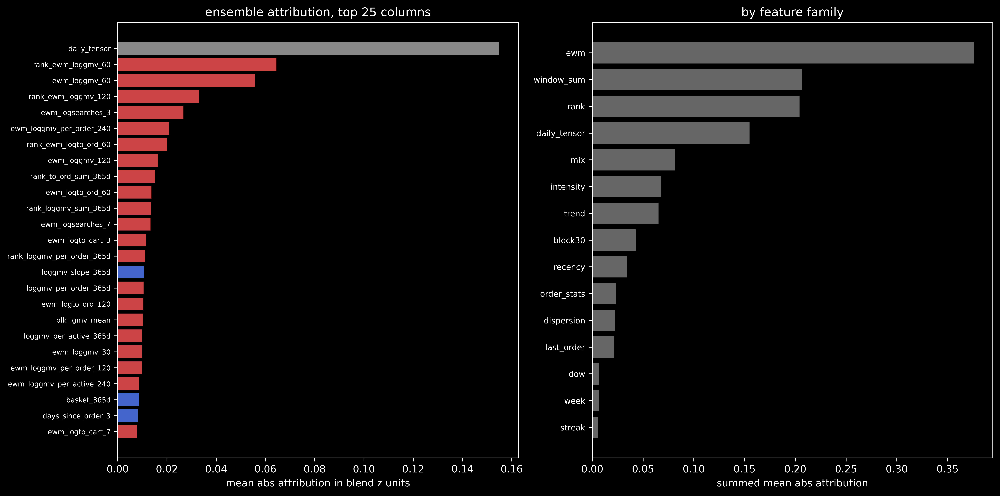

In [21]:
FAM_IMP = {f: float(IMP_A[np.equal(FAM_ALL, f)].sum()) for f in [*FAM_NAMES, "daily_tensor"]}
tot = sum(FAM_IMP.values())
print(f"{'family':<14}{'cols':>5}{'mean|a|':>11}{'share':>9}{'per col':>10}")
for f in sorted(FAM_IMP, key=lambda k: -FAM_IMP[k]):
    n_c = int(np.equal(FAM_ALL, f).sum())
    print(f"{f:<14}{n_c:>5}{FAM_IMP[f]:>11.5f}{FAM_IMP[f] / tot:>9.2%}{FAM_IMP[f] / n_c:>10.5f}")

fig, ax = plt.subplots(1, 2, figsize=(14, 7))
sel = np.argsort(-IMP_A)[:25][::-1]
ax[0].barh(
    range(len(sel)),
    IMP_A[sel],
    color=["#888" if j >= N_FEAT else ("#c44" if DIR[j] > 0 else "#46c") for j in sel],
)
ax[0].set_yticks(range(len(sel)), [COLS_ALL[j] for j in sel], fontsize=7)
ax[0].set_xlabel("mean abs attribution in blend z units")
ax[0].set_title("ensemble attribution, top 25 columns")
fo = sorted(FAM_IMP, key=lambda k: FAM_IMP[k])
ax[1].barh(range(len(fo)), [FAM_IMP[f] for f in fo], color="#666")
ax[1].set_yticks(range(len(fo)), fo, fontsize=8)
ax[1].set_xlabel("summed mean abs attribution")
ax[1].set_title("by feature family")
fig.savefig(FIGS / "ensemble_attribution.png")
plt.show()

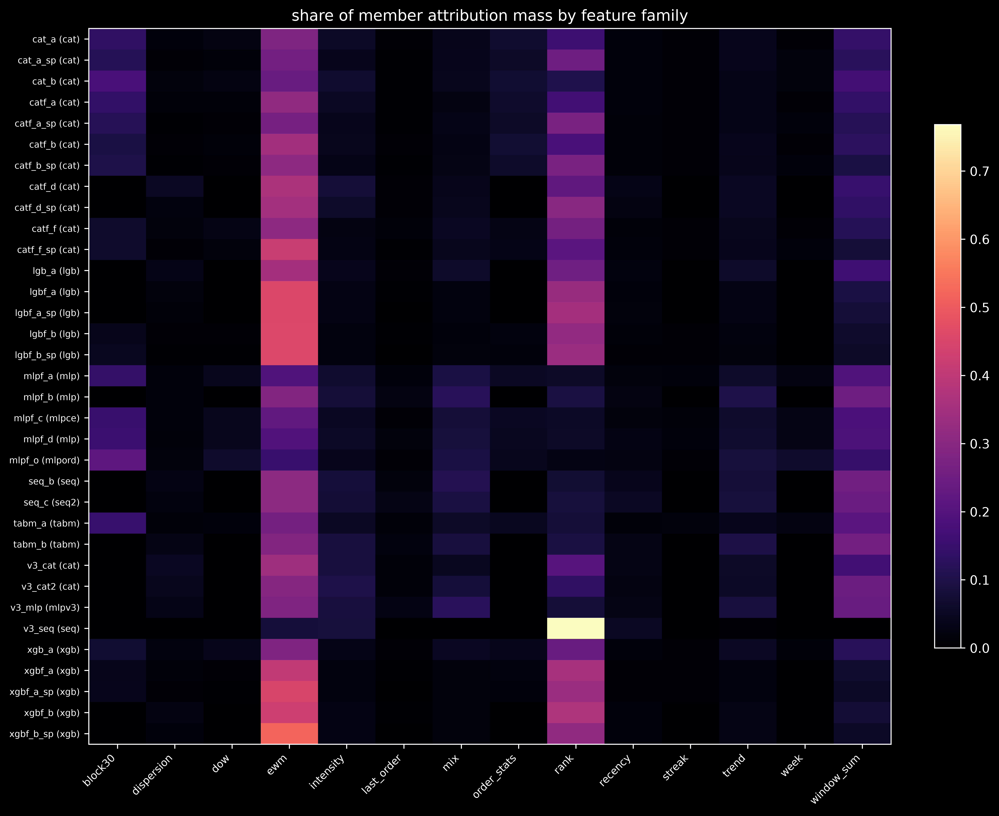

member      top family      share   second          share   tensor share
cat_a       ewm            28.07%   rank           15.67%               
cat_a_sp    ewm            26.06%   rank           24.95%               
cat_b       ewm            24.15%   block30        18.12%               
catf_a      ewm            31.47%   rank           16.70%               
catf_a_sp   rank           27.31%   ewm            26.53%               
catf_b      ewm            34.75%   rank           17.73%               
catf_b_sp   ewm            30.93%   rank           27.34%               
catf_d      ewm            36.47%   rank           22.30%               
catf_d_sp   ewm            35.06%   rank           30.24%               
catf_f      ewm            31.15%   rank           26.24%               
catf_f_sp   ewm            42.01%   rank           21.17%               
lgb_a       ewm            35.36%   rank           25.31%               
lgbf_a      ewm            45.51%   rank           

In [22]:
PROFILE = np.zeros((len(MEMBER_ORDER), len(FAM_NAMES)))
TENSOR_SHARE = {}
for i, n in enumerate(MEMBER_ORDER):
    a = np.abs(ATTR_ALL[n][:, :N_FEAT]).mean(axis=0)
    for j, f in enumerate(FAM_NAMES):
        PROFILE[i, j] = a[FAM_MASK[f]].sum()
    s = float(PROFILE[i].sum())
    if n in SEQ_MEMBERS:
        t = float(np.abs(SEQ_ATTR[n]).mean(axis=0).sum())
        TENSOR_SHARE[n] = t / (t + s)
    PROFILE[i] = PROFILE[i] / s if s > 0 else PROFILE[i]

fig, ax = plt.subplots(figsize=(11, 9))
im = ax.imshow(PROFILE, cmap="magma", aspect="auto")
ax.set_xticks(range(len(FAM_NAMES)), FAM_NAMES, rotation=45, ha="right", fontsize=8)
ax.set_yticks(range(len(MEMBER_ORDER)), [f"{n} ({KIND[n]})" for n in MEMBER_ORDER], fontsize=7)
ax.set_title("share of member attribution mass by feature family")
fig.colorbar(im, ax=ax, fraction=0.03)
fig.savefig(FIGS / "member_family_profile.png")
plt.show()

print(
    f"{'member':<12}{'top family':<13}{'share':>8}   {'second':<13}{'share':>8}{'tensor share':>15}"
)
for i, n in enumerate(MEMBER_ORDER):
    o = np.argsort(-PROFILE[i])
    ts = f"{TENSOR_SHARE[n]:.2%}" if n in TENSOR_SHARE else ""
    print(
        f"{n:<12}{FAM_NAMES[o[0]]:<13}{PROFILE[i, o[0]]:>8.2%}   {FAM_NAMES[o[1]]:<13}"
        f"{PROFILE[i, o[1]]:>8.2%}{ts:>15}"
    )

### Beeswarm

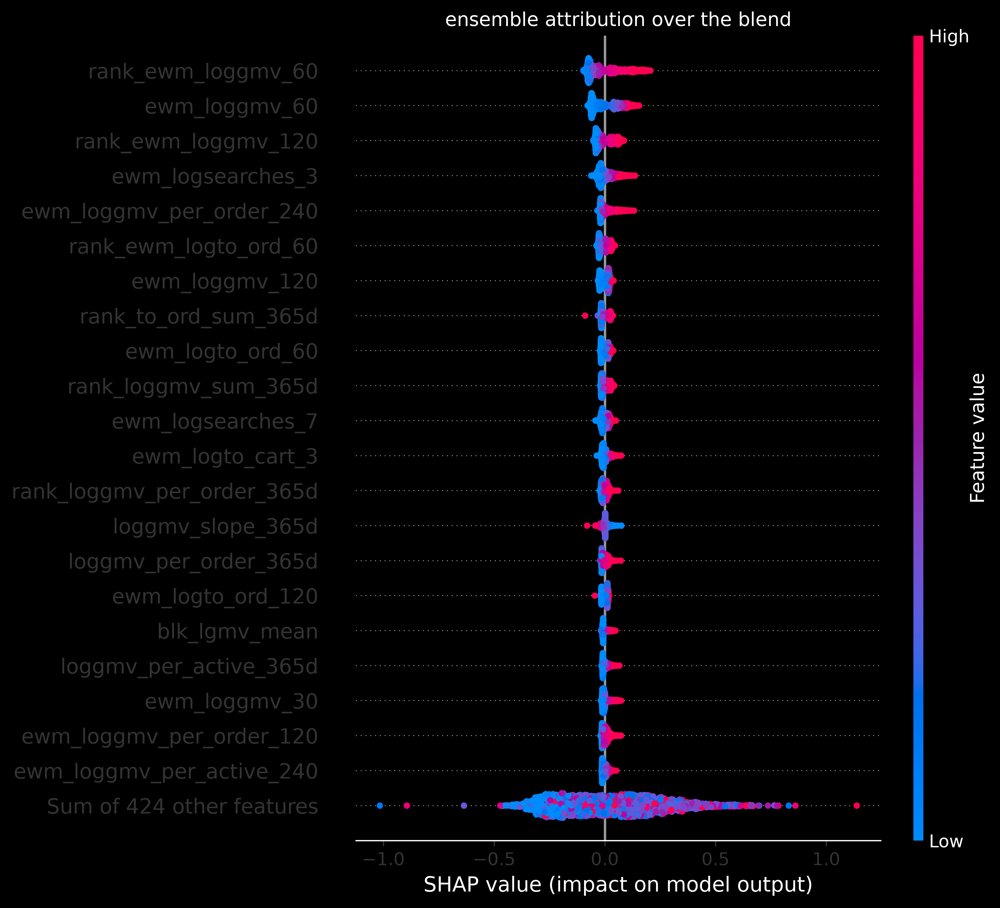

In [23]:
expl = shap.Explanation(
    values=ENS, base_values=np.full(NS, ENS_BASE), data=XS, feature_names=FEATURE_NAMES
)
shap.plots.beeswarm(expl, max_display=22, show=False)
plt.gcf().set_size_inches(9, 8)
plt.title("ensemble attribution over the blend")
plt.savefig(FIGS / "beeswarm_ensemble.png")
plt.show()

/tmp/ipykernel_570543/1763563175.py:13: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.savefig(FIGS / "dependence.png")
/home/alexv/hackathon-prod/.venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:158: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


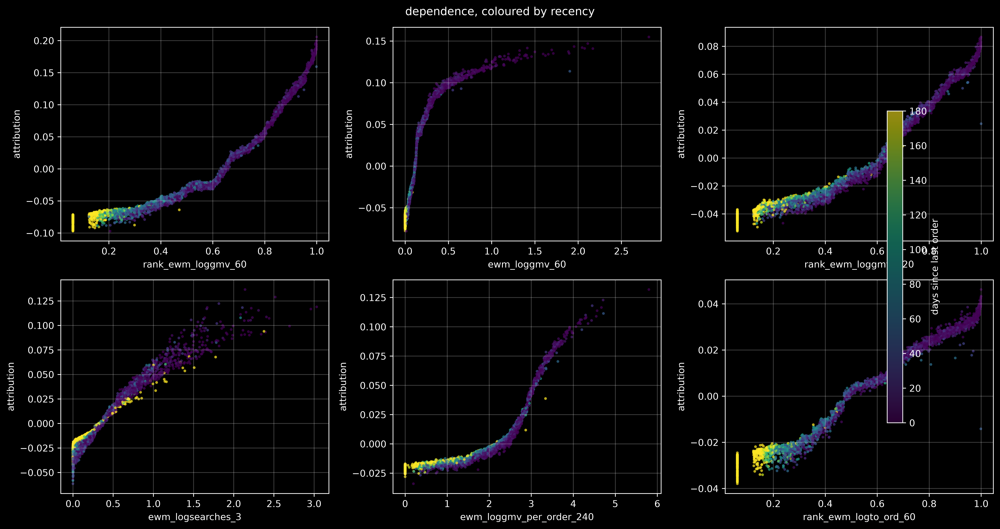

In [24]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for ax, j in zip(axes.ravel(), np.argsort(-IMP)[:6], strict=False):
    v = XS[:, j]
    c = XS[:, COL_IDX["days_since_last_order"]]
    s = ax.scatter(v, ENS[:, j], c=c, cmap="viridis", s=4, alpha=0.6)
    ax.set_xlabel(FEATURE_NAMES[j])
    ax.set_ylabel("attribution")
    ax.grid(alpha=0.25)
    if v.max() > 50 * max(np.median(v[v > 0]) if (v > 0).any() else 1, 1e-9):
        ax.set_xscale("symlog")
fig.colorbar(s, ax=axes, fraction=0.02, label="days since last order")
fig.suptitle("dependence, coloured by recency")
fig.savefig(FIGS / "dependence.png")
plt.show()

### Permutation panel

In [25]:
N_PERM = 20000
torch.cuda.empty_cache()
PERM = np.sort(RNG.choice(POOL, size=N_PERM, replace=False))
XP = np.ascontiguousarray(X445[PERM])
RGP = np.ascontiguousarray(RG445[PERM].astype(np.float32))
RGP_T = torch.from_numpy(RGP).to(DEV)
SEQP = {
    n: seq_panel(PERM, SEQ_CFG[n]["arch"], SEQ_CFG[n]["tag"], SEQ_CFG[n]["is_seq2"])
    for n in SEQ_MEMBERS
}
KEPT_LOADED = {}
for n in KEPT_MEMBERS:
    kind = KIND[n]
    if kind == "cat":
        b = CatBoostRegressor()
        b.load_model(str(MEMBER_DIR / n / f"sub_{SEED}.cbm"))
    elif kind == "xgb":
        b = xgb.Booster()
        b.load_model(str(MEMBER_DIR / n / f"sub_{SEED}.ubj"))
    elif kind == "lgb":
        b = lgb.Booster(model_file=str(MEMBER_DIR / n / f"sub_{SEED}.txt"))
    else:
        b = load_member(n, SEED)
    KEPT_LOADED[n] = b
BLEND_C = float(sum(GAIN[n] * MU_SUB[n] for n in KEPT_MEMBERS))


def blend_of(xr, rgt, seqt):
    out = np.zeros(len(xr))
    for n in KEPT_MEMBERS:
        kind = KIND[n]
        nc = 445 if MEMBERS[n]["v4"] else N_BASE
        b = KEPT_LOADED[n]
        if kind == "cat":
            p = np.asarray(b.predict(np.ascontiguousarray(xr[:, :nc])))
        elif kind == "xgb":
            p = np.asarray(b.inplace_predict(np.ascontiguousarray(xr[:, :nc])))
        elif kind == "lgb":
            p = np.asarray(b.predict(np.ascontiguousarray(xr[:, :nc])))
        elif kind in ("seq", "seq2"):
            sc = SEQ_CFG[n]
            outs = []
            with torch.no_grad():
                for k in range(0, len(xr), 4096):
                    mu, _ = b(seqt[n][k : k + 4096], rgt[k : k + 4096][:, sc["side_idx"]])
                    outs.append(mu.float().cpu().numpy())
            p = np.concatenate(outs)
        else:
            outs = []
            with torch.no_grad():
                for k in range(0, len(xr), 8192):
                    outs.append(nn_scalar(b, kind, rgt[k : k + 8192, :nc]).float().cpu().numpy())
            p = np.concatenate(outs)
        out += GAIN[n] * p
    return out - BLEND_C


BASE_P = blend_of(XP, RGP_T, SEQP)
print(
    f"panel blend  sd {BASE_P.std():.5f}  corr with shipped {np.corrcoef(BASE_P, LZ['kept'][PERM])[0, 1]:.6f}"
)

/tmp/ipykernel_570543/505703147.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(
/tmp/ipykernel_570543/505703147.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


panel blend  sd 0.67251  corr with shipped 0.999922


### Group permutation

In [26]:
sh = RNG.permutation(N_PERM)
SH_T = torch.from_numpy(sh).to(DEV)
GROUP_IMP = {}
t0 = time.time()
for f in FAM_NAMES:
    cols = np.flatnonzero(FAM_MASK[f])
    xr = XP.copy()
    xr[:, cols] = XP[np.ix_(sh, cols)]
    rgt = RGP_T.clone()
    rgt[:, cols] = RGP_T[SH_T][:, cols]
    p = blend_of(xr, rgt, SEQP)
    GROUP_IMP[f] = (float(np.abs(p - BASE_P).mean()), float(1.0 - np.corrcoef(p, BASE_P)[0, 1]))
    del xr, rgt
seqt = {n: SEQP[n][SH_T] for n in SEQ_MEMBERS}
p = blend_of(XP, RGP_T, seqt)
GROUP_IMP["daily_tensor"] = (
    float(np.abs(p - BASE_P).mean()),
    float(1.0 - np.corrcoef(p, BASE_P)[0, 1]),
)
del seqt
torch.cuda.empty_cache()
print(f"{time.time() - t0:.0f}s\n{'group':<15}{'mean abs shift':>16}{'1 - corr':>12}")
for f in sorted(GROUP_IMP, key=lambda k: -GROUP_IMP[k][0]):
    print(f"{f:<15}{GROUP_IMP[f][0]:>16.5f}{GROUP_IMP[f][1]:>12.6f}")

19s
group            mean abs shift    1 - corr
ewm                     0.32024    0.203547
rank                    0.19748    0.059423
daily_tensor            0.10506    0.012847
window_sum              0.06453    0.005934
mix                     0.03822    0.002669
trend                   0.03141    0.002342
block30                 0.02791    0.000927
order_stats             0.02234    0.000721
last_order              0.02170    0.000596
intensity               0.02089    0.000917
recency                 0.01925    0.000705
dispersion              0.01878    0.000603
streak                  0.00824    0.000139
dow                     0.00543    0.000067
week                    0.00377    0.000021


In [27]:
TOPF = [int(j) for j in np.argsort(-IMP)[:30]]
SINGLE_IMP = {}
t0 = time.time()
for j in TOPF:
    xr = XP.copy()
    xr[:, j] = XP[sh, j]
    rgt = RGP_T.clone()
    rgt[:, j] = RGP_T[SH_T, j]
    p = blend_of(xr, rgt, SEQP)
    SINGLE_IMP[FEATURE_NAMES[j]] = float(np.abs(p - BASE_P).mean())
    del xr, rgt
torch.cuda.empty_cache()
print(
    f"{time.time() - t0:.0f}s\n{'feature':<28}{'permutation':>13}{'shap rank':>11}{'perm rank':>11}"
)
pr = {k: i for i, k in enumerate(sorted(SINGLE_IMP, key=lambda k: -SINGLE_IMP[k]))}
for i, j in enumerate(TOPF):
    n = FEATURE_NAMES[j]
    print(f"{n:<28}{SINGLE_IMP[n]:>13.5f}{i + 1:>11}{pr[n] + 1:>11}")
sp_x = np.array([IMP[j] for j in TOPF])
sp_y = np.array([SINGLE_IMP[FEATURE_NAMES[j]] for j in TOPF])
print(
    f"\nrank correlation attribution vs permutation {np.corrcoef(np.argsort(np.argsort(-sp_x)), np.argsort(np.argsort(-sp_y)))[0, 1]:.4f}"
)

38s
feature                       permutation  shap rank  perm rank
rank_ewm_loggmv_60                0.07102          1          1
ewm_loggmv_60                     0.06754          2          2
rank_ewm_loggmv_120               0.04314          3          3
ewm_logsearches_3                 0.02971          4          4
ewm_loggmv_per_order_240          0.02674          5          5
rank_ewm_logto_ord_60             0.02339          6          6
ewm_loggmv_120                    0.01854          7          7
rank_to_ord_sum_365d              0.01749          8          8
ewm_logto_ord_60                  0.01455          9         11
rank_loggmv_sum_365d              0.01554         10         10
ewm_logsearches_7                 0.01340         11         15
ewm_logto_cart_3                  0.01300         12         16
rank_loggmv_per_order_365d        0.01188         13         18
loggmv_slope_365d                 0.01585         14          9
loggmv_per_order_365d             0.

### Local cases

case                       user       z       gmv   top signed attributions
whale                    381410    2.54     618.9  rank_ewm_loggmv_60 +0.171, ewm_loggmv_60 +0.120, ewm_loggmv_per_order_240 +0.104, rank_ewm_loggmv_120 +0.073
regular                  272608    0.77      35.3  ewm_loggmv_60 +0.069, rank_ewm_loggmv_60 +0.046, rank_ewm_loggmv_120 +0.036, rank_ewm_logto_ord_60 +0.024
lapsing                  362133   -0.81       1.7  rank_ewm_loggmv_60 -0.067, ewm_loggmv_60 -0.051, rank_ewm_loggmv_120 -0.028, rank_ewm_logto_ord_60 -0.022
never_ordered            147723   -1.27       0.3  rank_ewm_loggmv_60 -0.071, ewm_loggmv_60 -0.058, rank_ewm_loggmv_120 -0.037, ewm_logsearches_3 -0.029
search_only_no_order     461491   -1.29       0.2  rank_ewm_loggmv_60 -0.095, ewm_loggmv_60 -0.075, rank_ewm_loggmv_120 -0.051, ewm_logsearches_3 +0.042
reactivated              244214   -0.56       3.2  rank_ewm_loggmv_60 -0.050, ewm_loggmv_60 -0.033, rank_ewm_loggmv_120 -0.025, ewm_logsearches_

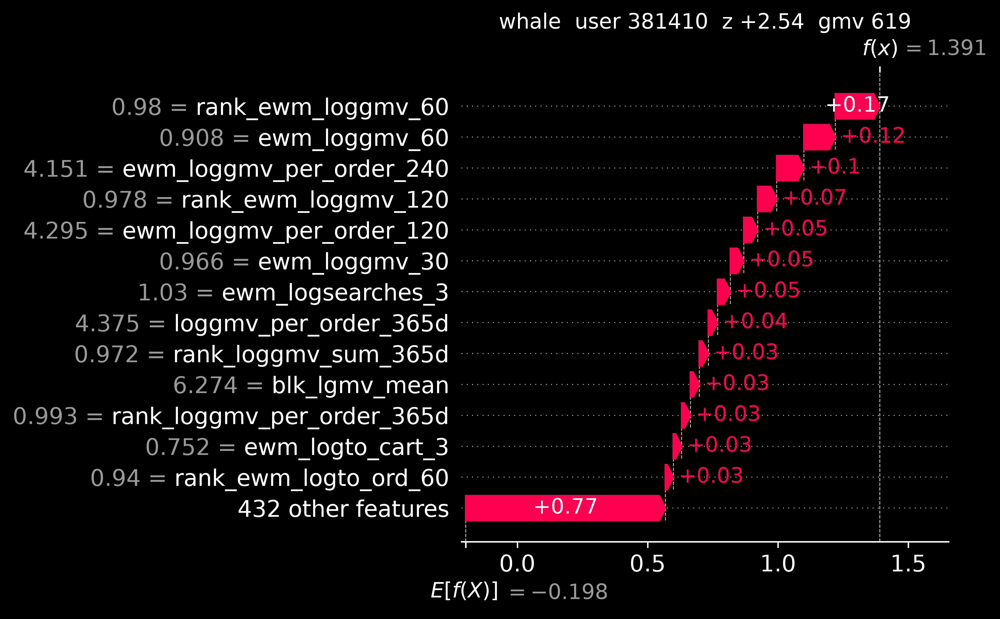

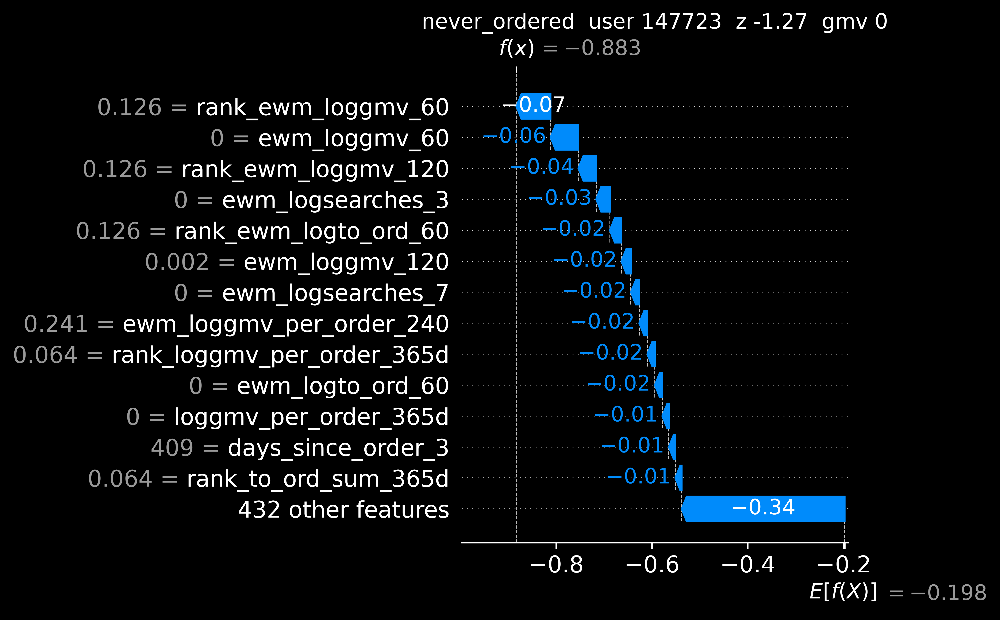

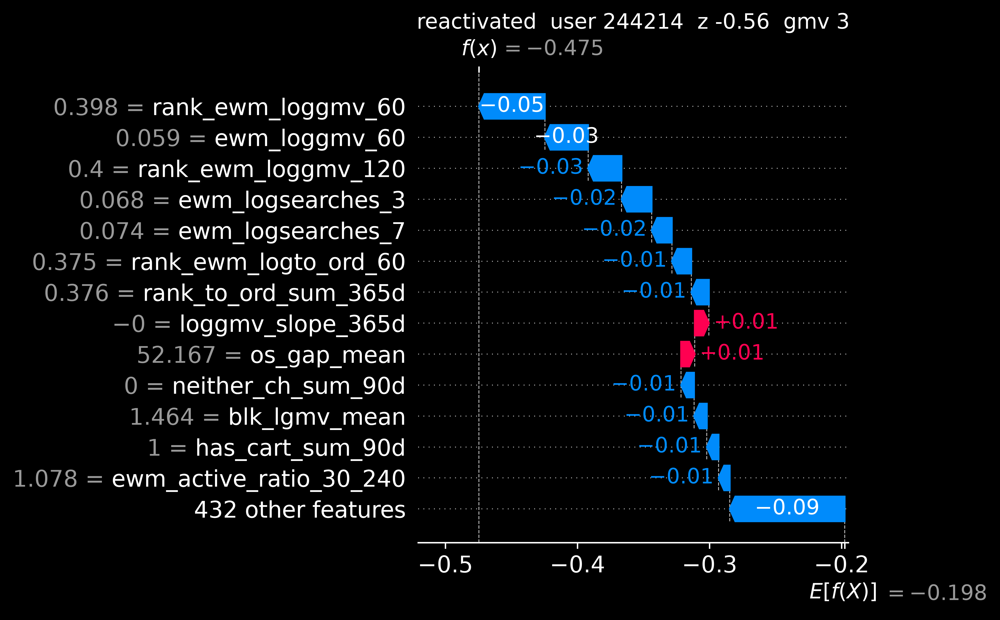

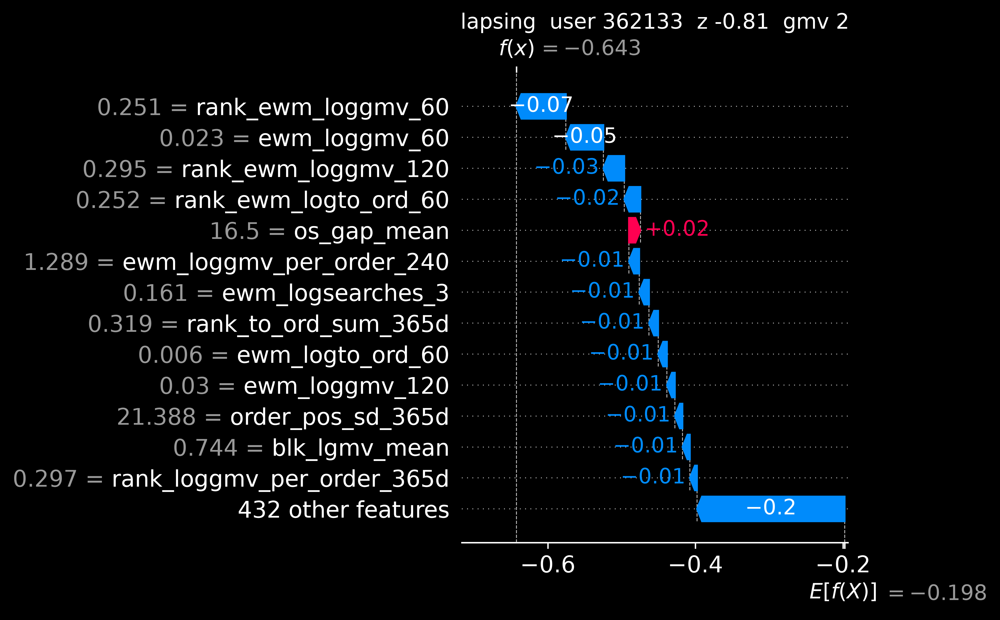

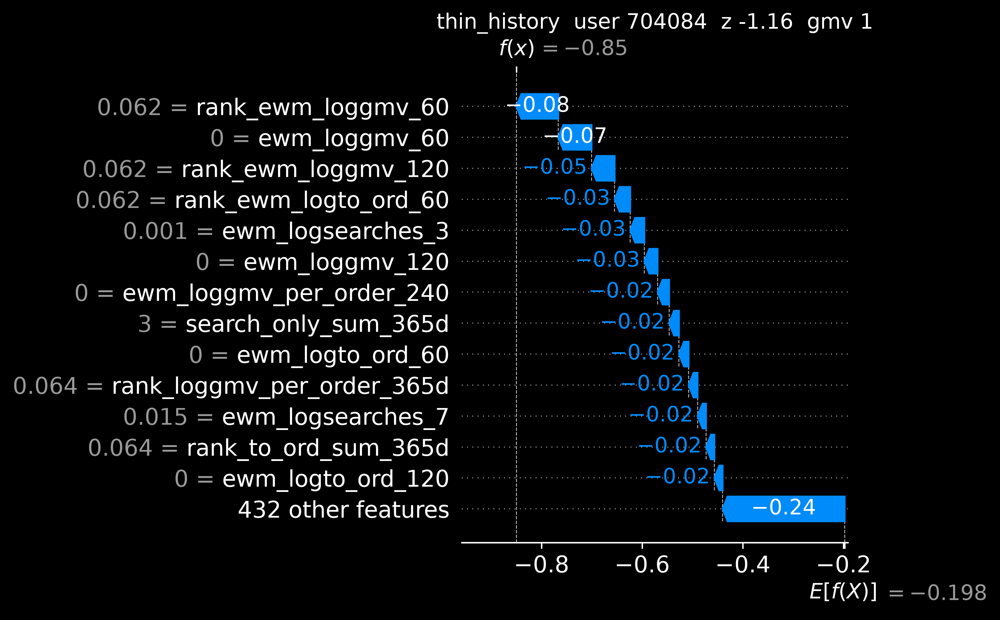

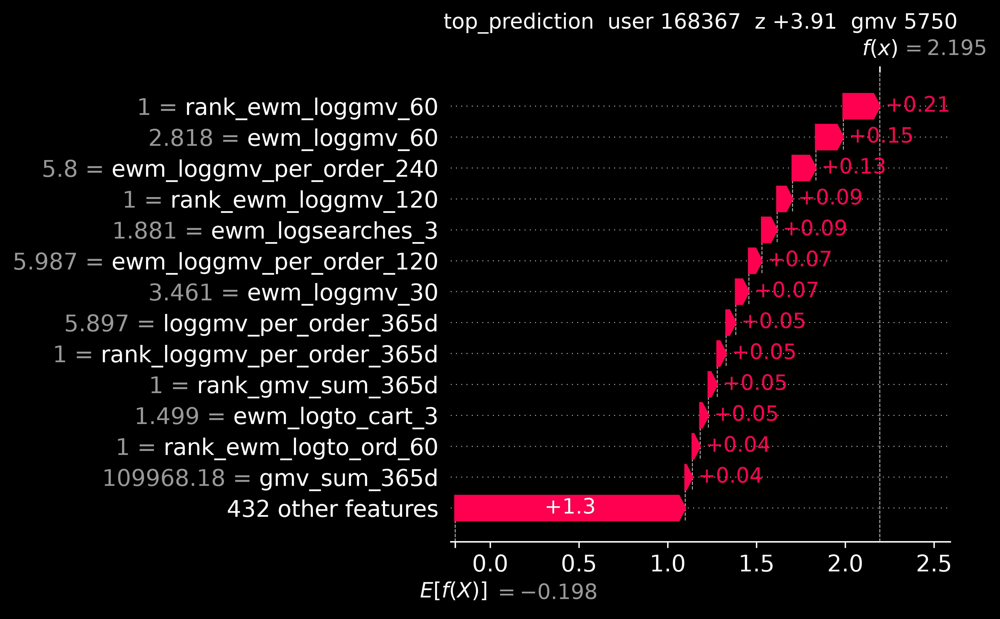

In [28]:
CASE_KEYS = list(CASES)
print(f"{'case':<22}{'user':>9}{'z':>8}{'gmv':>10}   top signed attributions")
for k in CASE_KEYS:
    r = CASE_ROW[k]
    a = ENS[r]
    o = np.argsort(-np.abs(a))[:4]
    parts = ", ".join(f"{FEATURE_NAMES[j]} {a[j]:+.3f}" for j in o)
    print(
        f"{k:<22}{USER_IDS[CASES[k]]:>9}{zlz[CASES[k]]:>8.2f}{PRED_GMV['kept'][CASES[k]]:>10.1f}  {parts}"
    )

for k in ["whale", "never_ordered", "reactivated", "lapsing", "thin_history", "top_prediction"]:
    r = CASE_ROW[k]
    e = shap.Explanation(
        values=ENS[r], base_values=ENS_BASE, data=XS[r], feature_names=FEATURE_NAMES
    )
    shap.plots.waterfall(e, max_display=14, show=False)
    plt.gcf().set_size_inches(8, 5)
    plt.title(
        f"{k}  user {USER_IDS[CASES[k]]}  z {zlz[CASES[k]]:+.2f}  gmv {PRED_GMV['kept'][CASES[k]]:.0f}"
    )
    plt.savefig(FIGS / f"waterfall_{k}.png")
    plt.show()

### Member disagreement

case                     spread   member z
whale                     0.055   cat_a_sp:+2.63, cat_b:+2.56, catf_b_sp:+2.59, catf_f:+2.45, catf_f_sp:+2.57, seq_b:+2.52
regular                   0.071   cat_a_sp:+0.73, cat_b:+0.70, catf_b_sp:+0.71, catf_f:+0.76, catf_f_sp:+0.76, seq_b:+0.76
lapsing                   0.067   cat_a_sp:-0.79, cat_b:-0.83, catf_b_sp:-0.81, catf_f:-0.84, catf_f_sp:-0.84, seq_b:-0.88
never_ordered             0.029   cat_a_sp:-1.27, cat_b:-1.27, catf_b_sp:-1.28, catf_f:-1.29, catf_f_sp:-1.28, seq_b:-1.24
search_only_no_order      0.025   cat_a_sp:-1.30, cat_b:-1.24, catf_b_sp:-1.29, catf_f:-1.27, catf_f_sp:-1.31, seq_b:-1.29
reactivated               0.026   cat_a_sp:-0.53, cat_b:-0.57, catf_b_sp:-0.54, catf_f:-0.54, catf_f_sp:-0.54, seq_b:-0.58
thin_history              0.041   cat_a_sp:-1.14, cat_b:-1.09, catf_b_sp:-1.11, catf_f:-1.16, catf_f_sp:-1.19, seq_b:-1.19
barely_active             0.056   cat_a_sp:-1.02, cat_b:-1.03, catf_b_sp:-1.03, catf_f:-1.05, ca

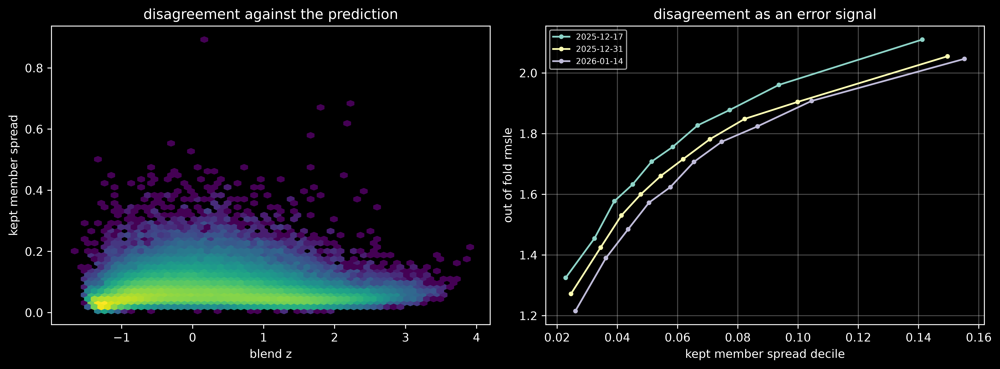

In [29]:
KEPT_COLS = np.array([MEMBER_ORDER.index(n) for n in KEPT_MEMBERS])
SPREAD = M_SUB[:, KEPT_COLS].std(axis=1)
print(f"{'case':<22}{'spread':>9}   member z")
for k in CASE_KEYS:
    u = CASES[k]
    zz = ", ".join(f"{n}:{M_SUB[u, MEMBER_ORDER.index(n)]:+.2f}" for n in KEPT_MEMBERS[:6])
    print(f"{k:<22}{SPREAD[u]:>9.3f}   {zz}")

q = np.quantile(SPREAD, [0.5, 0.9, 0.99])
print(f"\nspread median {q[0]:.3f}  p90 {q[1]:.3f}  p99 {q[2]:.3f}")
print(f"{'segment':<22}{'mean spread':>13}{'p99 share':>11}")
for s, m in SEGMENTS.items():
    print(f"{s:<22}{SPREAD[m].mean():>13.3f}{(SPREAD[m] > q[2]).mean():>11.2%}")

fig, ax = plt.subplots(1, 2, figsize=(12, 4.5))
ax[0].hexbin(zlz, SPREAD, gridsize=60, bins="log", cmap="viridis")
ax[0].set_xlabel("blend z")
ax[0].set_ylabel("kept member spread")
ax[0].set_title("disagreement against the prediction")
for a in EVAL_ANCHORS:
    sp = OOF_Z[a][:, KEPT_COLS].std(axis=1)
    y, pr = OOF_Y[a], OOF_PR[a]
    b = np.quantile(sp, np.linspace(0, 1, 11))
    idx = np.clip(np.digitize(sp, b[1:-1]), 0, 9)
    ax[1].plot(
        [sp[idx == i].mean() for i in range(10)],
        [np.sqrt(((pr[idx == i] - y[idx == i]) ** 2).mean()) for i in range(10)],
        "o-",
        ms=3,
        label=a,
    )
ax[1].set_xlabel("kept member spread decile")
ax[1].set_ylabel("out of fold rmsle")
ax[1].legend(fontsize=7)
ax[1].grid(alpha=0.3)
ax[1].set_title("disagreement as an error signal")
fig.savefig(FIGS / "disagreement.png")
plt.show()

### Surrogate

In [30]:
SUR_ROWS = np.sort(RNG.choice(POOL, size=60000, replace=False))
y_sur = zlz[SUR_ROWS]
sur = lgb.train(
    {
        "objective": "regression",
        "learning_rate": 0.05,
        "num_leaves": 255,
        "min_data_in_leaf": 100,
        "feature_fraction": 0.6,
        "bagging_fraction": 0.8,
        "bagging_freq": 1,
        "verbosity": -1,
        "num_threads": 16,
        "seed": SEED,
    },
    lgb.Dataset(X445[SUR_ROWS], label=y_sur, feature_name=list(FEATURE_NAMES)),
    num_boost_round=900,
)
HOLD = np.sort(RNG.choice(np.setdiff1d(POOL, SUR_ROWS), size=40000, replace=False))
ph = sur.predict(X445[HOLD])
SUR_R2 = float(1.0 - ((ph - zlz[HOLD]) ** 2).mean() / zlz[HOLD].var())
SUR_CORR = float(np.corrcoef(ph, zlz[HOLD])[0, 1])
print(f"surrogate on held out users  r2 {SUR_R2:.5f}  corr {SUR_CORR:.5f}")
gain = sur.feature_importance("gain")
print(f"\n{'feature':<28}{'surrogate gain share':>22}{'ensemble share':>16}")
for j in np.argsort(-gain)[:20]:
    print(f"{FEATURE_NAMES[j]:<28}{gain[j] / gain.sum():>22.2%}{IMP[j] / IMP.sum():>16.2%}")

surrogate on held out users  r2 0.99768  corr 0.99884

feature                       surrogate gain share  ensemble share
rank_ewm_loggmv_60                          38.51%           5.54%
ewm_loggmv_60                               35.32%           4.79%
ewm_loggmv_120                              12.34%           1.40%
rank_ewm_loggmv_120                          3.52%           2.84%
ewm_logto_ord_60                             2.18%           1.18%
rank_ewm_logto_ord_60                        2.10%           1.72%
blk_lgmv_mean                                0.55%           0.87%
ewm_logto_ord_120                            0.53%           0.90%
ewm_logsearches_3                            0.32%           2.30%
ewm_active_ratio_14_120                      0.28%           0.33%
ewm_loggmv_30                                0.27%           0.85%
ewm_logsearches_7                            0.23%           1.14%
ewm_active_ratio_7_60                        0.22%           0.17%
ewm_log

### Lime

In [31]:
from lime.lime_tabular import LimeTabularExplainer

LIME_BG = np.ascontiguousarray(X445[np.sort(RNG.choice(POOL, size=20000, replace=False))])
lime_exp = LimeTabularExplainer(
    LIME_BG,
    feature_names=list(FEATURE_NAMES),
    mode="regression",
    discretize_continuous=True,
    random_state=SEED,
)
cb = KEPT_LOADED["catf_b_sp"]
LIME_CASES = ["whale", "never_ordered", "reactivated", "lapsing", "thin_history", "regular"]
LIME_OUT = {}
for k in LIME_CASES:
    u = CASES[k]
    e_sur = lime_exp.explain_instance(X445[u], sur.predict, num_features=10, num_samples=4000)
    e_mem = lime_exp.explain_instance(
        X445[u],
        lambda z: np.asarray(cb.predict(np.ascontiguousarray(z))),
        num_features=10,
        num_samples=4000,
    )
    LIME_OUT[k] = (e_sur.as_list(), e_mem.as_list(), e_sur.score, e_mem.score)
    print(
        f"\n{k}  user {USER_IDS[u]}  z {zlz[u]:+.2f}  local r2 surrogate {e_sur.score:.3f} member {e_mem.score:.3f}"
    )
    print(f"  {'lime on surrogate':<52}{'lime on catf_b_sp'}")
    for (a, wa), (b, wb) in zip(e_sur.as_list(), e_mem.as_list(), strict=True):
        print(f"  {a:<44}{wa:>+7.3f}   {b:<44}{wb:>+7.3f}")

ModuleNotFoundError: No module named 'lime'

In [ ]:
print(f"{'case':<18}{'lime vs attribution overlap at 10':>36}{'sign agreement':>17}")
for k in LIME_CASES:
    r = CASE_ROW[k]
    top_a = {FEATURE_NAMES[j] for j in np.argsort(-np.abs(ENS[r]))[:10]}
    named = []
    for txt, w in LIME_OUT[k][0]:
        hit = [n for n in FEATURE_NAMES if n in txt]
        if hit:
            named.append((max(hit, key=len), w))
    ov = len({n for n, _ in named} & top_a)
    agree = np.mean([np.sign(w) == np.sign(ENS[r, COL_IDX[n]]) for n, w in named]) if named else 0.0
    print(f"{k:<18}{ov:>34}/10{agree:>17.0%}")

case                 lime vs attribution overlap at 10   sign agreement
whale                                              6/10             100%
never_ordered                                      6/10              90%
reactivated                                        2/10              60%
lapsing                                            5/10              80%
thin_history                                       4/10             100%
regular                                            7/10             100%


### Counterfactual

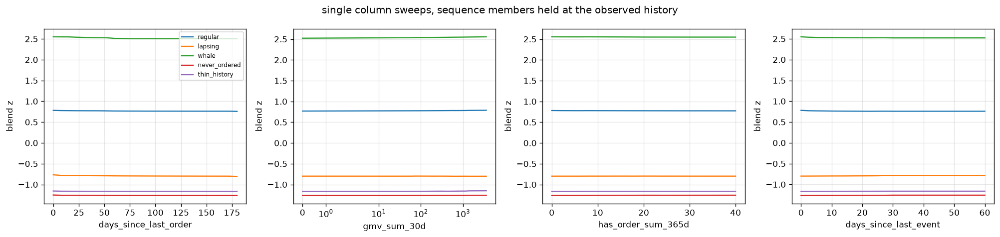

In [ ]:
SWEEPS = {
    "days_since_last_order": np.linspace(0, 180, 25),
    "gmv_sum_30d": np.concatenate([[0.0], np.geomspace(50, np.quantile(g30[g30 > 0], 0.999), 24)]),
    "has_order_sum_365d": np.arange(0, 41, 2).astype(float),
    "days_since_last_event": np.linspace(0, 60, 25),
}
RG_MAP = {}
for c in SWEEPS:
    j = COL_IDX[c]
    v = X445[:, j].astype(np.float64)
    o = np.argsort(v, kind="mergesort")
    uv, first = np.unique(v[o], return_index=True)
    RG_MAP[c] = (uv, np.asarray(RG445[o, j], dtype=np.float64)[first])

CF_USERS = ["regular", "lapsing", "whale", "never_ordered", "thin_history"]
fig, axes = plt.subplots(1, len(SWEEPS), figsize=(4.2 * len(SWEEPS), 4))
for ax, (c, grid) in zip(axes, SWEEPS.items(), strict=True):
    j = COL_IDX[c]
    for k in CF_USERS:
        u = CASES[k]
        xr = np.repeat(X445[u : u + 1], len(grid), axis=0)
        rg = np.repeat(RG445[u : u + 1].astype(np.float32), len(grid), axis=0)
        xr[:, j] = grid
        rg[:, j] = np.interp(grid, RG_MAP[c][0], RG_MAP[c][1]).astype(np.float32)
        seqt = {
            n: seq_panel(
                np.repeat(u, len(grid)),
                SEQ_CFG[n]["arch"],
                SEQ_CFG[n]["tag"],
                SEQ_CFG[n]["is_seq2"],
            )
            for n in SEQ_MEMBERS
        }
        p = blend_of(xr, torch.from_numpy(rg).to(DEV), seqt)
        ax.plot(grid, (p - LZ["kept"].mean()) / LZ["kept"].std(), "-", lw=1.4, label=k)
    ax.set_xlabel(c)
    ax.set_ylabel("blend z")
    ax.grid(alpha=0.3)
    if c == "gmv_sum_30d":
        ax.set_xscale("symlog")
axes[0].legend(fontsize=7)
fig.suptitle("single column sweeps, sequence members held at the observed history")
fig.savefig(FIGS / "counterfactual.png")
plt.show()

In [ ]:
REC_COLS = ["days_since_last_order", "days_since_last_event", "os_recency", "last_order_gap"]
shift = np.arange(0, 121, 5).astype(float)
print(
    f"{'case':<16}{'shift 0':>10}{'shift 30':>10}{'shift 60':>10}{'shift 120':>11}{'monotone':>10}"
)
for k in CF_USERS:
    u = CASES[k]
    xr = np.repeat(X445[u : u + 1], len(shift), axis=0)
    rg = np.repeat(RG445[u : u + 1].astype(np.float32), len(shift), axis=0)
    for c in REC_COLS:
        j = COL_IDX[c]
        nv = np.minimum(X445[u, j] + shift, 180.0 if c in CAP_COLS else 400.0)
        xr[:, j] = nv
        vv = X445[:, j].astype(np.float64)
        o = np.argsort(vv, kind="mergesort")
        uv, first = np.unique(vv[o], return_index=True)
        rg[:, j] = np.interp(nv, uv, np.asarray(RG445[o, j], dtype=np.float64)[first]).astype(
            np.float32
        )
    seqt = {
        n: seq_panel(
            np.repeat(u, len(shift)), SEQ_CFG[n]["arch"], SEQ_CFG[n]["tag"], SEQ_CFG[n]["is_seq2"]
        )
        for n in SEQ_MEMBERS
    }
    p = (blend_of(xr, torch.from_numpy(rg).to(DEV), seqt) - LZ["kept"].mean()) / LZ["kept"].std()
    mono = bool(np.all(np.diff(p) <= 1e-6))
    print(f"{k:<16}{p[0]:>10.3f}{p[6]:>10.3f}{p[12]:>10.3f}{p[24]:>11.3f}{mono!s:>10}")

case               shift 0  shift 30  shift 60  shift 120  monotone
regular              0.775     0.753     0.739      0.740     False
lapsing             -0.798    -0.779    -0.781     -0.779     False


whale                2.548     2.498     2.468      2.454     False
never_ordered       -1.269    -1.261    -1.260     -1.260     False
thin_history        -1.170    -1.164    -1.163     -1.164     False


### Corner cases

In [ ]:
SEG_ORDER = list(SEGMENTS)
SEG_STATS = {s: {} for s in SEG_ORDER}
for a in EVAL_ANCHORS:
    i = ANCHOR_IDX[a]
    m = COHORT[i]
    xa = np.asarray(np.load(FEAT / "x" / f"X_{a}.npy", mmap_mode="r"))[:, KEEP_IDX]
    xa = np.concatenate([xa, np.asarray(np.load(FEAT / "e" / f"E_{a}.npy", mmap_mode="r"))], axis=1)
    xa[:, CAP_IDX] = np.minimum(xa[:, CAP_IDX], CAP_AT)
    xa = np.concatenate(
        [xa, np.asarray(np.load(FEAT / "f" / f"F_{a}.npy", mmap_mode="r"))], axis=1
    )[m]
    ga, oa, ra, aa, sa, ta = (
        xa[:, COL_IDX["gmv_sum_365d"]],
        xa[:, COL_IDX["has_order_sum_365d"]],
        xa[:, COL_IDX["days_since_last_order"]],
        xa[:, COL_IDX["active_sum_30d"]],
        xa[:, COL_IDX["searches_sum_30d"]],
        xa[:, COL_IDX["tenure_days"]],
    )
    masks = {
        "whale": ga >= np.quantile(ga, 0.99),
        "regular": (oa >= 6) & (ra <= 30),
        "lapsing": (oa >= 3) & (ra >= 90),
        "never_ordered": oa == 0,
        "search_only_no_order": (oa == 0) & (sa >= np.quantile(sa[sa > 0], 0.5)),
        "reactivated": (ra <= 14) & (xa[:, COL_IDX["days_since_prev_order"]] >= 90),
        "thin_history": ta <= 90,
        "barely_active": aa <= 2,
        "cart_no_order": (xa[:, COL_IDX["has_cart_sum_90d"]] > 0)
        & (xa[:, COL_IDX["has_order_sum_90d"]] == 0),
        "single_order": oa == 1,
    }
    y = OOF_Y[a]
    pr = OOF_PR[a]
    for s, mm in masks.items():
        SEG_STATS[s][a] = (
            int(mm.sum()),
            float(np.sqrt(((pr[mm] - y[mm]) ** 2).mean())),
            float((pr[mm] - y[mm]).mean()),
            float(y[mm].mean()),
            float((TARGETS[i][m][mm] > 0).mean()),
        )
    del xa
    gc.collect()

print(
    f"{'segment':<22}{'share':>8}{'rmsle':>9}{'bias':>9}{'mean y':>9}{'p(y>0)':>9}{'lift vs all':>13}"
)
allr = {a: float(np.sqrt(((OOF_PR[a] - OOF_Y[a]) ** 2).mean())) for a in EVAL_ANCHORS}
base_r = float(np.mean(list(allr.values())))
for s in SEG_ORDER:
    n_s = np.mean([SEG_STATS[s][a][0] for a in EVAL_ANCHORS])
    sh = n_s / np.mean([len(OOF_Y[a]) for a in EVAL_ANCHORS])
    r = np.mean([SEG_STATS[s][a][1] for a in EVAL_ANCHORS])
    b = np.mean([SEG_STATS[s][a][2] for a in EVAL_ANCHORS])
    my = np.mean([SEG_STATS[s][a][3] for a in EVAL_ANCHORS])
    pp = np.mean([SEG_STATS[s][a][4] for a in EVAL_ANCHORS])
    print(f"{s:<22}{sh:>8.2%}{r:>9.4f}{b:>+9.4f}{my:>9.3f}{pp:>9.2%}{r - base_r:>+13.4f}")
print(f"{'all':<22}{1.0:>8.2%}{base_r:>9.4f}")

segment                  share    rmsle     bias   mean y   p(y>0)  lift vs all
whale                    1.00%   1.3737  -0.1283    6.201   96.48%      -0.3271
regular                 49.78%   1.7568  +0.0081    3.565   80.54%      +0.0560
lapsing                  5.33%   1.7485  +0.0254    1.116   31.21%      +0.0477
never_ordered           12.81%   1.0861  -0.0599    0.346   10.13%      -0.6147
search_only_no_order     2.44%   1.0694  -0.0740    0.345   10.40%      -0.6314
reactivated              2.61%   1.8693  +0.0357    1.486   41.16%      +0.1686
thin_history             1.73%   1.4805  -0.0105    1.117   29.76%      -0.2203
barely_active           10.73%   1.5133  -0.0273    0.820   22.09%      -0.1875
cart_no_order           17.77%   1.3828  -0.0289    0.637   18.34%      -0.3180
single_order             6.90%   1.4953  -0.0291    0.754   21.93%      -0.2055
all                    100.00%   1.7008


### Calibration

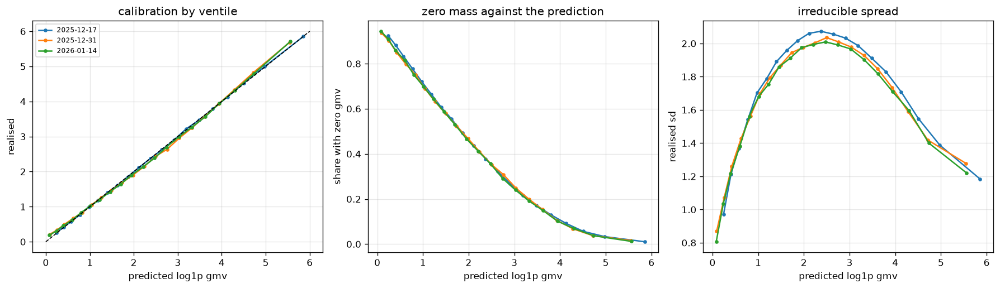

anchor          slope       r2  zero share    sd y  sd pred   shrink
2025-12-17     1.0000   0.4554      42.83%  2.3543   1.5888   0.6749
2025-12-31     1.0003   0.4563      45.16%  2.2970   1.5511   0.6753
2026-01-14     1.0004   0.4676      45.33%  2.2905   1.5657   0.6836


In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 4.4))
for a in EVAL_ANCHORS:
    y, pr = OOF_Y[a], OOF_PR[a]
    b = np.quantile(pr, np.linspace(0, 1, 21))
    idx = np.clip(np.digitize(pr, b[1:-1]), 0, 19)
    ax[0].plot(
        [pr[idx == i].mean() for i in range(20)],
        [y[idx == i].mean() for i in range(20)],
        "o-",
        ms=3,
        label=a,
    )
    ax[1].plot(
        [pr[idx == i].mean() for i in range(20)],
        [(y[idx == i] == 0).mean() for i in range(20)],
        "o-",
        ms=3,
    )
    ax[2].plot(
        [pr[idx == i].mean() for i in range(20)], [y[idx == i].std() for i in range(20)], "o-", ms=3
    )
lim = [0, 6]
ax[0].plot(lim, lim, "k--", lw=1)
ax[0].set_xlabel("predicted log1p gmv")
ax[0].set_ylabel("realised")
ax[0].set_title("calibration by ventile")
ax[0].legend(fontsize=7)
ax[1].set_xlabel("predicted log1p gmv")
ax[1].set_ylabel("share with zero gmv")
ax[1].set_title("zero mass against the prediction")
ax[2].set_xlabel("predicted log1p gmv")
ax[2].set_ylabel("realised sd")
ax[2].set_title("irreducible spread")
for a_ in ax:
    a_.grid(alpha=0.3)
fig.savefig(FIGS / "calibration.png")
plt.show()

print(
    f"{'anchor':<12}{'slope':>9}{'r2':>9}{'zero share':>12}{'sd y':>8}{'sd pred':>9}{'shrink':>9}"
)
for a in EVAL_ANCHORS:
    y, pr = OOF_Y[a], OOF_PR[a]
    sl = float(np.polyfit(pr, y, 1)[0])
    print(
        f"{a:<12}{sl:>9.4f}{np.corrcoef(pr, y)[0, 1] ** 2:>9.4f}{(y == 0).mean():>12.2%}"
        f"{y.std():>8.4f}{pr.std():>9.4f}{pr.std() / y.std():>9.4f}"
    )

In [ ]:
a = EVAL_ANCHORS[-1]
y, pr = OOF_Y[a], OOF_PR[a]
res = pr - y
print(f"anchor {a}   rmsle {np.sqrt((res**2).mean()):.4f}   n {len(y)}")
print(f"{'bucket':<26}{'n':>8}{'rmsle':>9}{'bias':>9}{'share of squared error':>24}")
tot = float((res**2).sum())
buckets = {
    "y zero, predicted high": (y == 0) & (pr > 3.0),
    "y zero, predicted low": (y == 0) & (pr <= 3.0),
    "y high, predicted zero": (y > 5.0) & (pr < 1.0),
    "y high, predicted high": (y > 5.0) & (pr >= 4.0),
    "both mid": (y > 0) & (y <= 5.0) & (pr > 1.0) & (pr <= 4.0),
}
for k, mm in buckets.items():
    print(
        f"{k:<26}{mm.sum():>8}{np.sqrt((res[mm] ** 2).mean()):>9.4f}{res[mm].mean():>+9.4f}"
        f"{float((res[mm] ** 2).sum()) / tot:>24.2%}"
    )

anchor 2026-01-14   rmsle 1.6713   n 244983
bucket                           n    rmsle     bias  share of squared error
y zero, predicted high        8491   3.6692  +3.6329                  16.71%
y zero, predicted low       102559   1.3174  +1.0500                  26.01%
y high, predicted zero         917   5.1070  -5.0629                   3.50%
y high, predicted high       21286   1.1739  -0.9162                   4.29%
both mid                     70578   1.3986  -0.8687                  20.18%


### Mlp internals

In [ ]:
LIN_MEMBERS = [n for n in NN_MEMBERS if KIND[n] in ("mlp", "mlpv3")]
BACKBONE = {}
print(
    f"{'member':<10}{'skip var share':>16}{'body var share':>16}{'corr skip total':>17}{'dead units':>12}"
)
for name in LIN_MEMBERS:
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    model = load_member(name, SEED)
    with torch.no_grad():
        xb = RG_S[:, :nc]
        body = torch.cat([model["body"](xb[k : k + 8192]) for k in range(0, NS, 8192)])
        skip = model["skip"](xb)
        w0 = model["head"].weight[0]
        s_part = (skip @ w0).float().cpu().numpy()
        b_part = (body @ w0).float().cpu().numpy()
        coef = (w0 @ model["skip"].weight).float().cpu().numpy()
        dead = float((body.abs().max(dim=0).values < 1e-4).float().mean())
    BACKBONE[name] = (coef, s_part, b_part, body.float().cpu().numpy())
    tot = s_part + b_part
    print(
        f"{name:<10}{s_part.var() / tot.var():>16.4f}{b_part.var() / tot.var():>16.4f}"
        f"{np.corrcoef(s_part, tot)[0, 1]:>17.4f}{dead:>12.2%}"
    )
    del model
    torch.cuda.empty_cache()

name = LIN_MEMBERS[0]
coef = BACKBONE[name][0]
o = np.argsort(-np.abs(coef))[:20]
print(f"\nlinear backbone of {name} on rank gauss inputs")
print(f"{'feature':<28}{'coef':>9}   {'family':<13}{'ensemble rank':>15}")
rank_of = {int(j): i for i, j in enumerate(np.argsort(-IMP))}
for j in o:
    print(f"{FEATURE_NAMES[j]:<28}{coef[j]:>+9.4f}   {FAMILY[j]:<13}{rank_of[int(j)] + 1:>15}")

member      skip var share  body var share  corr skip total  dead units
mlpf_a              0.5670          0.0825           0.9858       0.00%
mlpf_b              0.5390          0.0970           0.9821       0.00%
mlpf_d              0.6503          0.0553           0.9890       0.00%
v3_mlp              0.7040          0.0710           0.9731       0.00%

linear backbone of mlpf_a on rank gauss inputs
feature                          coef   family         ensemble rank
ewm_logsearches_3             +0.0445   ewm                        4
os_recency                    -0.0409   order_stats              362
basket_365d                   -0.0384   intensity                 22
ewm_loggmv_per_order_240      +0.0380   ewm                        5
os_gap_mean                   -0.0347   order_stats               28
blk_has_11                    -0.0344   block30                  179
os_span                       +0.0336   order_stats               59
active_trend_90_365           -0.0334   

In [ ]:
name = LIN_MEMBERS[0]
H = BACKBONE[name][3]
Hc = H - H.mean(axis=0)
ev = np.linalg.svd(Hc, compute_uv=False) ** 2
pr = float(ev.sum() ** 2 / (ev**2).sum())
print(
    f"{name} penultimate 256 units   participation ratio {pr:.2f}   top pc share {ev[0] / ev.sum():.2%}"
)
probe_targets = {
    "blend z": zlz[SAMP],
    "log gmv 30d": np.log1p(XS[:, COL_IDX["gmv_sum_30d"]]),
    "recency": XS[:, COL_IDX["days_since_last_order"]],
    "orders 365d": XS[:, COL_IDX["has_order_sum_365d"]],
    "searches 30d": np.log1p(XS[:, COL_IDX["searches_sum_30d"]]),
}
A = np.column_stack([Hc, np.ones(NS)])
print(f"\n{'probe target':<16}{'r2 from 256 units':>20}{'best single unit r':>21}")
for k, t in probe_targets.items():
    c, *_ = np.linalg.lstsq(A, t - t.mean(), rcond=None)
    probe_r2 = 1.0 - ((A @ c - (t - t.mean())) ** 2).mean() / t.var()
    cc = np.abs(np.corrcoef(np.column_stack([Hc, t]).T)[-1, :-1])
    print(f"{k:<16}{probe_r2:>20.4f}{np.nanmax(cc):>21.4f}")

mlpf_a penultimate 256 units   participation ratio 2.85   top pc share 55.15%

probe target       r2 from 256 units   best single unit r


blend z                       0.9958               0.9522
log gmv 30d                   0.9734               0.8250


recency                       0.9773               0.8985
orders 365d                   0.9781               0.9429
searches 30d                  0.9403               0.7898


### Auxiliary heads

In [ ]:
AUX = {}
for name in NN_MEMBERS + SEQ_MEMBERS:
    kind = KIND[name]
    nc = 445 if MEMBERS[name]["v4"] else N_BASE
    model = load_member(name, SEED)
    with torch.no_grad():
        if kind in ("seq", "seq2"):
            sc = SEQ_CFG[name]
            lg = torch.cat(
                [
                    model(SEQP[name][k : k + 4096], RGP_T[k : k + 4096][:, sc["side_idx"]])[1]
                    for k in range(0, N_PERM, 4096)
                ]
            )
            AUX[name] = ("p_positive", torch.sigmoid(lg.float()).cpu().numpy())
        elif kind == "tabm":
            o = torch.cat([model(RGP_T[k : k + 4096, :nc]) for k in range(0, N_PERM, 4096)])
            AUX[name] = ("p_positive", torch.sigmoid(o[:, :, 1].float().mean(dim=1)).cpu().numpy())
            AUX[name + "_spread"] = ("k spread", o[:, :, 0].float().std(dim=1).cpu().numpy())
        elif kind == "mlp":
            o = torch.cat(
                [
                    model["head"](
                        model["body"](RGP_T[k : k + 8192, :nc])
                        + model["skip"](RGP_T[k : k + 8192, :nc])
                    )
                    for k in range(0, N_PERM, 8192)
                ]
            ).float()
            AUX[name] = ("p_positive", o[:, 1].cpu().numpy())
            AUX[name + "_sd"] = (
                "expected deviation",
                np.sqrt(np.clip(o[:, 2].cpu().numpy(), 0, None) * 10.0),
            )
    del model
    torch.cuda.empty_cache()

POS_HEADS = [k for k, v in AUX.items() if v[0] == "p_positive"]
print(
    f"historical p(y>0) at the last scored anchors: {', '.join(f'{lv["anchor"]} {lv["p_positive"]:.3f}' for lv in LEVELS[-3:])}"
)
print(f"\n{'head':<12}{'mean p':>9}{'sd':>8}{'corr with blend z':>19}")
for k in POS_HEADS:
    v = AUX[k][1]
    print(f"{k:<12}{v.mean():>9.4f}{v.std():>8.4f}{np.corrcoef(v, zlz[PERM])[0, 1]:>19.4f}")
P_POS = np.mean([AUX[k][1] for k in POS_HEADS], axis=0)
print(f"\n{'segment':<22}{'mean p(y>0) head':>18}{'realised p(y>0) 2026-01-14':>28}")
i14 = ANCHOR_IDX["2026-01-14"]
m14 = COHORT[i14]
y14 = TARGETS[i14][m14] > 0
A14 = "2026-01-14"
x14 = np.asarray(np.load(FEAT / "x" / f"X_{A14}.npy", mmap_mode="r"))[:, KEEP_IDX]
x14 = np.concatenate(
    [x14, np.asarray(np.load(FEAT / "e" / f"E_{A14}.npy", mmap_mode="r"))], axis=1
)[m14]
for s in SEG_ORDER:
    mm = SEGMENTS[s][PERM]
    if s == "whale":
        mr = x14[:, COL_IDX["gmv_sum_365d"]] >= np.quantile(x14[:, COL_IDX["gmv_sum_365d"]], 0.99)
    elif s == "never_ordered":
        mr = x14[:, COL_IDX["has_order_sum_365d"]] == 0
    elif s == "lapsing":
        mr = (x14[:, COL_IDX["has_order_sum_365d"]] >= 3) & (
            np.minimum(x14[:, COL_IDX["days_since_last_order"]], CAP_AT) >= 90
        )
    elif s == "regular":
        mr = (x14[:, COL_IDX["has_order_sum_365d"]] >= 6) & (
            np.minimum(x14[:, COL_IDX["days_since_last_order"]], CAP_AT) <= 30
        )
    else:
        mr = None
    rv = f"{y14[mr].mean():.4f}" if mr is not None and mr.sum() > 0 else ""
    print(f"{s:<22}{P_POS[mm].mean():>18.4f}{rv:>28}")
del x14
gc.collect()

/tmp/ipykernel_511416/2903934257.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


/tmp/ipykernel_511416/2903934257.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


historical p(y>0) at the last scored anchors: 2025-12-31 0.548, 2026-01-07 0.549, 2026-01-14 0.547

head           mean p      sd  corr with blend z
mlpf_a         0.5537  0.3112             0.9559
mlpf_b         0.5488  0.3118             0.9547
mlpf_d         0.5430  0.3088             0.9555
tabm_a         0.5362  0.3077             0.9648
tabm_b         0.5455  0.3061             0.9618
seq_b          0.5396  0.3089             0.9592
seq_c          0.5458  0.3090             0.9604
v3_seq         0.5474  0.3049             0.9593

segment                 mean p(y>0) head  realised p(y>0) 2026-01-14


whale                             0.9621                      0.9637
regular                           0.8114                      0.8020
lapsing                           0.2984                      0.2923
never_ordered                     0.0909                      0.0900
search_only_no_order              0.0885                            
reactivated                       0.4182                            
thin_history                      0.2496                            
barely_active                     0.2228                            
cart_no_order                     0.1728                            
single_order                      0.2060                            


75

### Distribution heads

mlpf_c bins 48 over [-2.8, 9.2]   mlpf_o bins 32
segment                    mean    sd ce   sd ord   entropy  p below zero
whale                     4.063    1.235    1.234     2.731         0.034
regular                   1.281    1.695    1.672     2.943         0.191
lapsing                  -1.291    1.660    1.681     2.229         0.718
never_ordered            -1.984    0.990    0.977     1.606         0.909
search_only_no_order     -1.960    1.008    1.021     1.641         0.900
reactivated              -0.810    1.834    1.827     2.529         0.589
thin_history             -1.339    1.294    1.306     1.993         0.747
barely_active            -1.492    1.414    1.401     1.987         0.784
cart_no_order            -1.726    1.255    1.249     1.858         0.835
single_order             -1.616    1.392    1.364     1.981         0.801

correlation of the two predicted spreads 0.9899
correlation of ce spread with kept member spread 0.5121


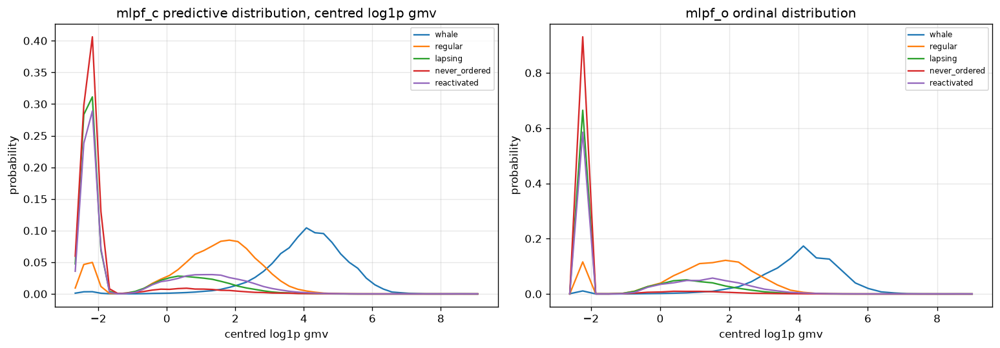

In [ ]:
model = load_member("mlpf_c", SEED)
with torch.no_grad():
    logits = torch.cat(
        [
            model["head"](model["body"](RG_S[k : k + 8192]) + model["skip"](RG_S[k : k + 8192]))
            for k in range(0, NS, 8192)
        ]
    ).float()
    PCE = torch.softmax(logits, dim=1).cpu().numpy()
del model
torch.cuda.empty_cache()
model = load_member("mlpf_o", SEED)
with torch.no_grad():
    lo = torch.cat(
        [
            model["head"](model["body"](RG_S[k : k + 8192]) + model["skip"](RG_S[k : k + 8192]))
            for k in range(0, NS, 8192)
        ]
    ).float()
    p = torch.sigmoid(lo)
    surv = torch.cat([torch.ones_like(p[:, :1]), torch.cumprod(p, dim=1)], dim=1)
    nxt = torch.cat([torch.cumprod(p, dim=1), torch.zeros_like(p[:, :1])], dim=1)
    prob = surv - nxt
    PORD = (prob / prob.sum(dim=1, keepdim=True).clamp_min(1e-8)).cpu().numpy()
del model
torch.cuda.empty_cache()

mu_ce = PCE @ HL_CENTERS
sd_ce = np.sqrt(np.clip(PCE @ (HL_CENTERS**2) - mu_ce**2, 0, None))
ent_ce = -(PCE * np.log(np.clip(PCE, 1e-12, None))).sum(axis=1)
mu_or = PORD @ ORD_CENTERS
sd_or = np.sqrt(np.clip(PORD @ (ORD_CENTERS**2) - mu_or**2, 0, None))
print(f"mlpf_c bins {HL_BINS} over [{HL_LO}, {HL_HI}]   mlpf_o bins {ORD_BINS}")
print(f"{'segment':<22}{'mean':>9}{'sd ce':>9}{'sd ord':>9}{'entropy':>10}{'p below zero':>14}")
zero_cut = -np.mean([lv["mean_log1p"] for lv in LEVELS[-3:]]) + 0.5
zero_bin = np.less(HL_CENTERS, zero_cut)
for s in SEG_ORDER:
    mm = SEGMENTS[s][SAMP]
    print(
        f"{s:<22}{mu_ce[mm].mean():>9.3f}{sd_ce[mm].mean():>9.3f}{sd_or[mm].mean():>9.3f}"
        f"{ent_ce[mm].mean():>10.3f}{PCE[mm][:, zero_bin].sum(axis=1).mean():>14.3f}"
    )
print(f"\ncorrelation of the two predicted spreads {np.corrcoef(sd_ce, sd_or)[0, 1]:.4f}")
print(
    f"correlation of ce spread with kept member spread {np.corrcoef(sd_ce, SPREAD[SAMP])[0, 1]:.4f}"
)

fig, ax = plt.subplots(1, 2, figsize=(13, 4.6))
for k in ["whale", "regular", "lapsing", "never_ordered", "reactivated"]:
    r = CASE_ROW[k]
    ax[0].plot(HL_CENTERS, PCE[r], "-", lw=1.4, label=k)
    ax[1].plot(ORD_CENTERS, PORD[r], "-", lw=1.4, label=k)
ax[0].set_title("mlpf_c predictive distribution, centred log1p gmv")
ax[1].set_title("mlpf_o ordinal distribution")
for a_ in ax:
    a_.set_xlabel("centred log1p gmv")
    a_.set_ylabel("probability")
    a_.grid(alpha=0.3)
    a_.legend(fontsize=7)
fig.savefig(FIGS / "distribution_heads.png")
plt.show()

### Sequence attention

In [ ]:
def encoder_trace(enc, x):
    hs, ws = [], []
    h = x
    for layer in enc.layers:
        y = layer.norm1(h)
        a, w = layer.self_attn(y, y, y, need_weights=True, average_attn_weights=False)
        h = h + a
        y = layer.norm2(h)
        h = h + layer.linear2(layer.activation(layer.linear1(y)))
        hs.append(h)
        ws.append(w)
    if enc.norm is not None:
        h = enc.norm(h)
    return h, hs, ws


ATTN, POOLW, TRACE = {}, {}, {}
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    net = load_member(name, SEED)
    enc = net.encoder.enc if sc["is_seq2"] else net.enc
    proj = net.encoder.proj if sc["is_seq2"] else net.proj
    pos = net.encoder.pos if sc["is_seq2"] else net.pos
    n_patch = int(sc["n_patch"])
    aw = None
    pooled_layers = []
    pw = []
    with torch.no_grad():
        for k in range(0, NS, 512):
            s = SEQ_S[name][k : k + 512]
            h0 = proj(s) + pos
            h, hs, ws = encoder_trace(enc, h0)
            if k == 0:
                ref = net.encoder(s) if sc["is_seq2"] else net.enc(h0)
                print(f"{name}  manual trace matches module to {float((h - ref).abs().max()):.2e}")
            stacked = torch.stack([w.sum(dim=0) for w in ws]).float().cpu().numpy()
            aw = stacked if aw is None else aw + stacked
            pw.append(torch.softmax(net.attn(h), dim=1)[:, :, 0].float().cpu().numpy())
            pooled_layers.append(
                np.stack([x.mean(dim=1).float().cpu().numpy() for x in [h0, *hs]], axis=1)
            )
    ATTN[name] = aw / NS
    POOLW[name] = np.concatenate(pw)
    TRACE[name] = np.concatenate(pooled_layers)
    print(
        f"{name}  attention {ATTN[name].shape}  pooling {POOLW[name].shape}  trace {TRACE[name].shape}"
    )
    del net
    torch.cuda.empty_cache()

/tmp/ipykernel_511416/2903934257.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(
/tmp/ipykernel_511416/2903934257.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_b  manual trace matches module to 5.72e-03
seq_b  attention (6, 8, 52, 52)  pooling (3013, 52)  trace (3013, 7, 256)
seq_c  manual trace matches module to 7.08e-04


seq_c  attention (6, 8, 52, 52)  pooling (3013, 52)  trace (3013, 7, 256)
v3_seq  manual trace matches module to 4.68e-04
v3_seq  attention (6, 6, 22, 22)  pooling (3013, 22)  trace (3013, 7, 192)


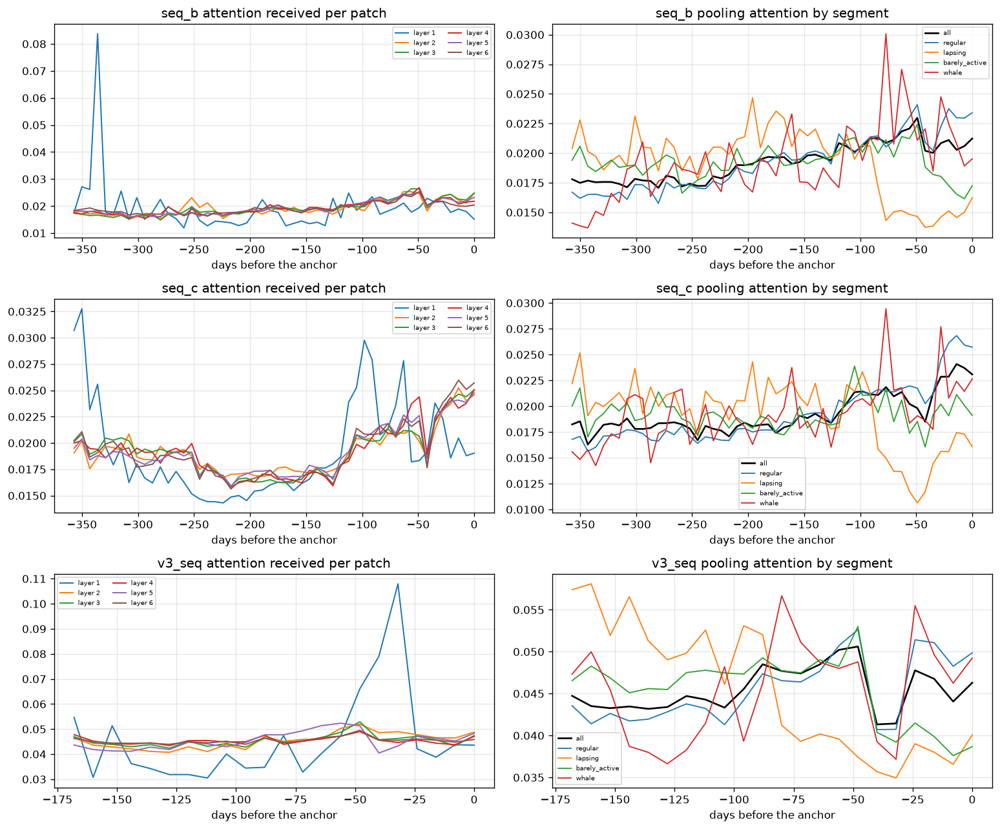

member    layer  head entropy   mean lookback days  last patch share
seq_b         1         3.865                127.7            0.0151
seq_b         2         3.941                122.9            0.0248
seq_b         3         3.939                119.8            0.0248
seq_b         4         3.943                121.3            0.0218
seq_b         5         3.943                121.4            0.0232
seq_b         6         3.946                121.3            0.0204
seq_c         1         3.920                124.5            0.0190
seq_c         2         3.944                120.6            0.0246
seq_c         3         3.943                121.4            0.0251
seq_c         4         3.943                121.8            0.0251
seq_c         5         3.944                122.5            0.0248
seq_c         6         3.942                123.5            0.0257
v3_seq        1         3.025                 59.2            0.0436
v3_seq        2         3.088     

In [ ]:
fig, axes = plt.subplots(len(SEQ_MEMBERS), 2, figsize=(13, 3.6 * len(SEQ_MEMBERS)))
for row, name in enumerate(SEQ_MEMBERS):
    sc = SEQ_CFG[name]
    patch = int(sc["patch"])
    n_patch = int(sc["n_patch"])
    days_back = -(np.arange(n_patch)[::-1] * patch)
    a = ATTN[name].mean(axis=1)
    recv = a.mean(axis=1)
    for li in range(a.shape[0]):
        axes[row, 0].plot(days_back, recv[li], "-", lw=1.2, label=f"layer {li + 1}")
    axes[row, 0].set_title(f"{name} attention received per patch")
    axes[row, 0].set_xlabel("days before the anchor")
    axes[row, 0].legend(fontsize=6, ncol=2)
    axes[row, 0].grid(alpha=0.3)
    axes[row, 1].plot(days_back, POOLW[name].mean(axis=0), "k-", lw=1.6, label="all")
    for s in ["regular", "lapsing", "barely_active", "whale"]:
        axes[row, 1].plot(
            days_back, POOLW[name][SEGMENTS[s][SAMP]].mean(axis=0), "-", lw=1.1, label=s
        )
    axes[row, 1].set_title(f"{name} pooling attention by segment")
    axes[row, 1].set_xlabel("days before the anchor")
    axes[row, 1].legend(fontsize=6)
    axes[row, 1].grid(alpha=0.3)
fig.savefig(FIGS / "seq_attention.png")
plt.show()

print(
    f"{'member':<9}{'layer':>6}{'head entropy':>14}{'mean lookback days':>21}{'last patch share':>18}"
)
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    patch, n_patch = int(sc["patch"]), int(sc["n_patch"])
    dist = (np.arange(n_patch)[None, :] - np.arange(n_patch)[:, None]) * patch
    for li in range(ATTN[name].shape[0]):
        a = ATTN[name][li].mean(axis=0)
        ent = float(-(a * np.log(np.clip(a, 1e-12, None))).sum(axis=1).mean())
        look = float((a * np.abs(dist)).sum(axis=1).mean())
        print(f"{name:<9}{li + 1:>6}{ent:>14.3f}{look:>21.1f}{a[:, -1].mean():>18.4f}")

### Patch occlusion

/tmp/ipykernel_511416/2903934257.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_b    whole tensor removed shifts mu by -0.7807 on average, sd 0.5292


/tmp/ipykernel_511416/2903934257.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_c    whole tensor removed shifts mu by -0.6680 on average, sd 0.3944


v3_seq   whole tensor removed shifts mu by -0.2137 on average, sd 0.2227


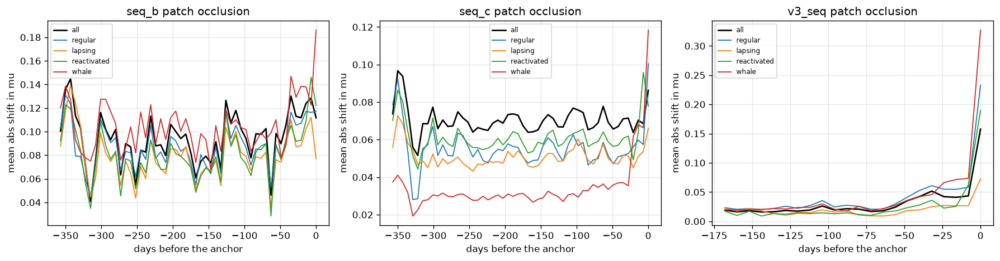

member     last 30d share  last 90d share  beyond 180d share
seq_b              11.92%          27.48%             49.11%
seq_c               9.85%          24.92%             50.24%
v3_seq             40.56%          73.45%              0.00%


In [ ]:
OCC = {}
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    net = load_member(name, SEED)
    n_patch = int(sc["n_patch"])
    with torch.no_grad():
        base = (
            torch.cat(
                [
                    net(SEQ_S[name][k : k + 2048], SIDE_S[k : k + 2048, sc["side_idx"]])[0]
                    for k in range(0, NS, 2048)
                ]
            )
            .float()
            .cpu()
            .numpy()
        )
        d = np.zeros((NS, n_patch))
        for t in range(n_patch):
            outs = []
            for k in range(0, NS, 2048):
                s = SEQ_S[name][k : k + 2048].clone()
                s[:, t, :] = 0.0
                outs.append(net(s, SIDE_S[k : k + 2048, sc["side_idx"]])[0].float().cpu().numpy())
            d[:, t] = np.concatenate(outs) - base
        s = SEQ_S[name].clone()
        s[:] = 0.0
        outs = []
        for k in range(0, NS, 2048):
            outs.append(
                net(s[k : k + 2048], SIDE_S[k : k + 2048, sc["side_idx"]])[0].float().cpu().numpy()
            )
        full = np.concatenate(outs) - base
    OCC[name] = (d, base, full)
    print(
        f"{name:<9}whole tensor removed shifts mu by {full.mean():+.4f} on average, sd {full.std():.4f}"
    )
    del net
    torch.cuda.empty_cache()

fig, axes = plt.subplots(1, len(SEQ_MEMBERS), figsize=(5 * len(SEQ_MEMBERS), 4))
for ax, name in zip(axes, SEQ_MEMBERS, strict=True):
    sc = SEQ_CFG[name]
    patch, n_patch = int(sc["patch"]), int(sc["n_patch"])
    days_back = -(np.arange(n_patch)[::-1] * patch)
    d = OCC[name][0]
    ax.plot(days_back, np.abs(d).mean(axis=0), "k-", lw=1.6, label="all")
    for s in ["regular", "lapsing", "reactivated", "whale"]:
        ax.plot(days_back, np.abs(d[SEGMENTS[s][SAMP]]).mean(axis=0), "-", lw=1.1, label=s)
    ax.set_title(f"{name} patch occlusion")
    ax.set_xlabel("days before the anchor")
    ax.set_ylabel("mean abs shift in mu")
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7)
fig.savefig(FIGS / "seq_occlusion.png")
plt.show()

print(f"{'member':<9}{'last 30d share':>16}{'last 90d share':>16}{'beyond 180d share':>19}")
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    patch, n_patch = int(sc["patch"]), int(sc["n_patch"])
    days_back = np.arange(n_patch)[::-1] * patch
    w = np.abs(OCC[name][0]).mean(axis=0)
    print(
        f"{name:<9}{w[days_back < 30].sum() / w.sum():>16.2%}{w[days_back < 90].sum() / w.sum():>16.2%}"
        f"{w[days_back >= 180].sum() / w.sum():>19.2%}"
    )

### Head blocks

In [ ]:
print(f"{'member':<9}{'block':<16}{'mean abs shift':>16}{'sd shift':>11}")
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    net = load_member(name, SEED)
    n_pool = 5 if sc["pool13"] else 4
    labels = (
        ["last patch", "last 4", "last 13", "attention pool", "side"]
        if n_pool == 5
        else ["last patch", "last 4", "attention pool", "side"]
    )
    with torch.no_grad():
        blocks, mus = [], []
        for k in range(0, NS, 2048):
            s = SEQ_S[name][k : k + 2048]
            sd = SIDE_S[k : k + 2048, sc["side_idx"]]
            h = net.encoder(s) if sc["is_seq2"] else net.enc(net.proj(s) + net.pos)
            w = torch.softmax(net.attn(h), dim=1)
            pooled = [h[:, -1], h[:, -4:].mean(1)]
            if n_pool == 5:
                pooled.append(h[:, -13:].mean(1))
            pooled += [(h * w).sum(1), net.side(sd)]
            blocks.append(torch.stack(pooled, dim=1))
            mus.append(net.head(torch.cat(pooled, dim=1))[:, 0])
        B = torch.cat(blocks)
        mu0 = torch.cat(mus).float().cpu().numpy()
        mean_b = B.mean(dim=0, keepdim=True)
        for bi in range(n_pool):
            Bc = B.clone()
            Bc[:, bi] = mean_b[:, bi]
            mu1 = (
                torch.cat([net.head(Bc[k : k + 4096].flatten(1))[:, 0] for k in range(0, NS, 4096)])
                .float()
                .cpu()
                .numpy()
            )
            print(
                f"{name:<9}{labels[bi]:<16}{np.abs(mu1 - mu0).mean():>16.4f}{(mu1 - mu0).std():>11.4f}"
            )
    del net, B
    torch.cuda.empty_cache()

member   block             mean abs shift   sd shift
seq_b    last patch                0.0324     0.0535
seq_b    last 4                    0.0778     0.1026
seq_b    last 13                   0.1672     0.2195
seq_b    attention pool            0.2101     0.2533
seq_b    side                      0.8855     1.0085


/tmp/ipykernel_511416/2903934257.py:81: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(
/tmp/ipykernel_511416/2903934257.py:124: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.enc = nn.TransformerEncoder(


seq_c    last patch                0.0587     0.0772
seq_c    last 4                    0.1133     0.1361
seq_c    last 13                   0.1335     0.1568
seq_c    attention pool            0.0853     0.1001
seq_c    side                      0.9173     1.0883
v3_seq   last patch                0.0773     0.1059
v3_seq   last 4                    0.0821     0.1079
v3_seq   attention pool            0.0668     0.0859
v3_seq   side                      1.1896     1.4211


### Layer geometry

In [ ]:
def cka(a, b):
    a = a - a.mean(axis=0)
    b = b - b.mean(axis=0)
    num = np.linalg.norm(a.T @ b, "fro") ** 2
    return float(num / (np.linalg.norm(a.T @ a, "fro") * np.linalg.norm(b.T @ b, "fro")))


probe = {
    "blend z": zlz[SAMP],
    "log gmv 30d": np.log1p(XS[:, COL_IDX["gmv_sum_30d"]]),
    "recency": XS[:, COL_IDX["days_since_last_order"]],
    "orders 365d": XS[:, COL_IDX["has_order_sum_365d"]],
    "tenure": XS[:, COL_IDX["tenure_days"]],
}
for name in SEQ_MEMBERS:
    T = TRACE[name]
    n_layer = T.shape[1]
    print(f"\n{name}   {n_layer - 1} encoder layers, width {T.shape[2]}")
    print(
        f"{'layer':<8}{'participation':>15}{'cka to input':>14}{'cka to top':>12}"
        + "".join(f"{k:>15}" for k in probe)
    )
    for li in range(n_layer):
        h = T[:, li] - T[:, li].mean(axis=0)
        ev = np.linalg.svd(h, compute_uv=False) ** 2
        row = f"{'input' if li == 0 else li:<8}{ev.sum() ** 2 / (ev**2).sum():>15.2f}"
        row += f"{cka(T[:, li], T[:, 0]):>14.3f}{cka(T[:, li], T[:, -1]):>12.3f}"
        A = np.column_stack([h, np.ones(NS)])
        for t in probe.values():
            c, *_ = np.linalg.lstsq(A, t - t.mean(), rcond=None)
            row += f"{1.0 - ((A @ c - (t - t.mean())) ** 2).mean() / t.var():>15.4f}"
        print(row)


seq_b   6 encoder layers, width 256
layer     participation  cka to input  cka to top        blend z    log gmv 30d        recency    orders 365d         tenure
input              1.72         1.000       0.679         0.8809         0.5409         0.4630         0.9890         0.3171


1                  1.49         0.709       0.956         0.9223         0.5788         0.6874         0.9928         0.5790
2                  1.38         0.725       0.982         0.9261         0.5851         0.7214         0.9924         0.5428


3                  1.30         0.723       0.989         0.9265         0.5862         0.7221         0.9920         0.5236
4                  1.31         0.713       0.993         0.9267         0.5854         0.7289         0.9912         0.5035


5                  1.33         0.696       0.998         0.9265         0.5866         0.7313         0.9908         0.4884
6                  1.34         0.679       1.000         0.9275         0.5845         0.7318         0.9906         0.4792

seq_c   6 encoder layers, width 256
layer     participation  cka to input  cka to top        blend z    log gmv 30d        recency    orders 365d         tenure


input              1.90         1.000       0.765         0.8839         0.5473         0.4667         0.9877         0.3256
1                  1.73         0.945       0.920         0.9583         0.6818         0.7450         0.9970         0.6804


2                  1.51         0.858       0.978         0.9540         0.6736         0.7510         0.9967         0.6633
3                  1.40         0.809       0.993         0.9540         0.6729         0.7676         0.9968         0.6511


4                  1.37         0.776       0.998         0.9543         0.6779         0.7742         0.9969         0.6405
5                  1.39         0.768       1.000         0.9562         0.6845         0.7823         0.9969         0.6273


6                  1.43         0.765       1.000         0.9569         0.6866         0.7875         0.9970         0.6163

v3_seq   6 encoder layers, width 192
layer     participation  cka to input  cka to top        blend z    log gmv 30d        recency    orders 365d         tenure
input              1.89         1.000       0.687         0.9086         0.6027         0.5453         0.9255         0.2196


1                  2.76         0.943       0.852         0.9237         0.6200         0.7068         0.9204         0.4175
2                  2.51         0.827       0.951         0.9304         0.6221         0.7848         0.9207         0.3981


3                  2.39         0.770       0.978         0.9322         0.6224         0.8007         0.9211         0.3871
4                  2.40         0.734       0.989         0.9326         0.6225         0.8034         0.9217         0.3889


5                  2.44         0.706       0.997         0.9328         0.6219         0.8106         0.9220         0.3872
6                  2.49         0.687       1.000         0.9334         0.6239         0.8122         0.9225         0.3852


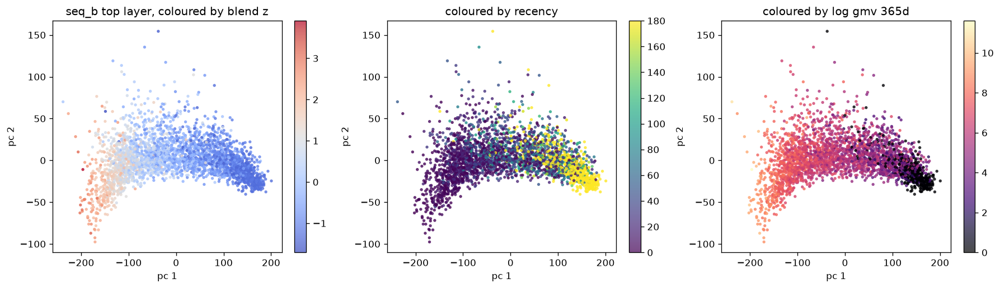

In [ ]:
name = SEQ_MEMBERS[0]
T = TRACE[name]
h = T[:, -1] - T[:, -1].mean(axis=0)
u, s, _ = np.linalg.svd(h, full_matrices=False)
pc = u[:, :2] * s[:2]
fig, ax = plt.subplots(1, 3, figsize=(15, 4.4))
sc0 = ax[0].scatter(pc[:, 0], pc[:, 1], c=zlz[SAMP], cmap="coolwarm", s=5, alpha=0.7)
ax[0].set_title(f"{name} top layer, coloured by blend z")
fig.colorbar(sc0, ax=ax[0], fraction=0.046)
sc1 = ax[1].scatter(
    pc[:, 0],
    pc[:, 1],
    c=np.minimum(XS[:, COL_IDX["days_since_last_order"]], 180),
    cmap="viridis",
    s=5,
    alpha=0.7,
)
ax[1].set_title("coloured by recency")
fig.colorbar(sc1, ax=ax[1], fraction=0.046)
sc2 = ax[2].scatter(
    pc[:, 0], pc[:, 1], c=np.log1p(XS[:, COL_IDX["gmv_sum_365d"]]), cmap="magma", s=5, alpha=0.7
)
ax[2].set_title("coloured by log gmv 365d")
fig.colorbar(sc2, ax=ax[2], fraction=0.046)
for a_ in ax:
    a_.set_xlabel("pc 1")
    a_.set_ylabel("pc 2")
fig.savefig(FIGS / "seq_layer_pca.png")
plt.show()

### Sequence channels

In [ ]:
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    a = np.abs(SEQ_ATTR[name]).mean(axis=0)
    per_ch = a.sum(axis=0)
    names = sc["channels"]
    o = np.argsort(-per_ch)[:10]
    print(f"\n{name}  attribution mass by tensor channel")
    for j in o:
        print(
            f"  {names[j] if j < len(names) else f'ch_{j}':<22}{per_ch[j]:>10.4f}{per_ch[j] / per_ch.sum():>9.2%}"
        )


seq_b  attribution mass by tensor channel
  sum_active                1.3204   16.51%
  sum_searches              0.9450   11.81%
  sum_search_to_cart        0.5579    6.97%
  sum_gmv_search            0.5398    6.75%
  max_searches              0.5123    6.40%
  max_gmv_search            0.4980    6.23%
  max_active                0.4847    6.06%
  valid                     0.4690    5.86%
  sum_search_to_ord         0.3909    4.89%
  max_search_to_cart        0.3661    4.58%

seq_c  attribution mass by tensor channel
  sum_active                0.4858   10.09%
  max_search_to_ord         0.4656    9.67%
  sum_gmv_search            0.4176    8.67%
  sum_searches              0.3895    8.09%
  max_gmv_search            0.3850    7.99%
  sum_search                0.2789    5.79%
  sum_search_to_ord         0.2574    5.34%
  sum_search_to_cart        0.2505    5.20%
  sum_cat                   0.2010    4.17%
  max_active                0.1892    3.93%

v3_seq  attribution mass by tenso

### Residual combiner


kept  lgbm  residual sd 0.00693 against linear sd 0.67414  ratio 0.0103  corr +0.0159
input              mean abs contribution    share
xgbf_a_sp                        0.00271   16.20%
xgb_a                            0.00232   13.86%
v3_mlp                           0.00195   11.65%
v3_seq                           0.00176   10.52%
seq_b                            0.00172   10.27%
catf_f                           0.00125    7.44%
catf_b_sp                        0.00108    6.46%
catf_f_sp                        0.00105    6.25%



all  xgb  residual sd 0.00727 against linear sd 0.67414  ratio 0.0108  corr +0.0155
input              mean abs contribution    share
lgbf_a                           0.01071   22.16%
catf_f_sp                        0.00311    6.43%
tabm_b                           0.00290    6.01%
lgbf_a_sp                        0.00239    4.94%
seq_b                            0.00194    4.01%
mlpf_d                           0.00184    3.81%
xgbf_b                           0.00166    3.43%
v3_mlp                           0.00163    3.37%

users moved by more than 0.0155 in blend z: 2500
segment                 share among movers  share overall  mean move
whale                                0.24%          1.00%   -0.01348
regular                             54.64%         47.63%   +0.00154
lapsing                              2.16%          5.90%   -0.00213
never_ordered                        0.04%         12.79%   -0.00571
search_only_no_order                 0.04%          2.52%   -0.00536
r

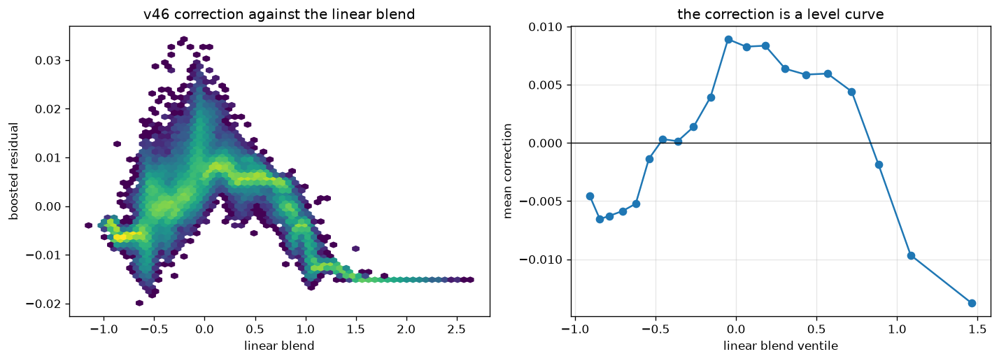

In [ ]:
COMB_SHAP = {}
for scope, family, fname in (
    ("kept", "lgbm", "v46_lgbm_residual.txt"),
    ("all", "xgb", "v47_xgb_residual.ubj"),
):
    cols = np.array(NNLS[scope]["columns"])
    names = [*[MEMBER_ORDER[i] for i in cols], "linear blend"]
    xs = np.column_stack([M_SUB[:, cols], LZ[scope]])
    if family == "lgbm":
        b = lgb.Booster(model_file=str(COMBINER_DIR / fname))
        sv = np.asarray(b.predict(xs, pred_contrib=True))
    else:
        b = xgb.Booster()
        b.load_model(str(COMBINER_DIR / fname))
        sv = b.predict(xgb.DMatrix(xs), pred_contribs=True)
    COMB_SHAP[scope] = (sv, names)
    imp = np.abs(sv[:, :-1]).mean(axis=0)
    f = BOOST_F[scope]
    print(
        f"\n{scope}  {family}  residual sd {f.std():.5f} against linear sd {LZ[scope].std():.5f}"
        f"  ratio {f.std() / LZ[scope].std():.4f}  corr {np.corrcoef(f, LZ[scope])[0, 1]:+.4f}"
    )
    print(f"{'input':<16}{'mean abs contribution':>24}{'share':>9}")
    for j in np.argsort(-imp)[:8]:
        print(f"{names[j]:<16}{imp[j]:>24.5f}{imp[j] / imp.sum():>9.2%}")

f = BOOST_F["kept"]
q = np.quantile(np.abs(f), 0.99)
movers = np.abs(f) > q
print(f"\nusers moved by more than {q:.4f} in blend z: {movers.sum()}")
print(f"{'segment':<22}{'share among movers':>20}{'share overall':>15}{'mean move':>11}")
for s in SEG_ORDER:
    m = SEGMENTS[s]
    print(
        f"{s:<22}{(m & movers).sum() / movers.sum():>20.2%}{m.mean():>15.2%}{f[m].mean():>+11.5f}"
    )

fig, ax = plt.subplots(1, 2, figsize=(12, 4.4))
ax[0].hexbin(LZ["kept"], BOOST_F["kept"], gridsize=60, bins="log", cmap="viridis")
ax[0].set_xlabel("linear blend")
ax[0].set_ylabel("boosted residual")
ax[0].set_title("v46 correction against the linear blend")
b = np.quantile(LZ["kept"], np.linspace(0, 1, 21))
idx = np.clip(np.digitize(LZ["kept"], b[1:-1]), 0, 19)
ax[1].plot(
    [LZ["kept"][idx == i].mean() for i in range(20)],
    [BOOST_F["kept"][idx == i].mean() for i in range(20)],
    "o-",
)
ax[1].axhline(0, color="k", lw=0.8)
ax[1].set_xlabel("linear blend ventile")
ax[1].set_ylabel("mean correction")
ax[1].grid(alpha=0.3)
ax[1].set_title("the correction is a level curve")
fig.savefig(FIGS / "combiner.png")
plt.show()

### Direction layer

In [ ]:
SIGMA = float(np.sqrt(W_TOTAL))
SE_B, RIDGE = 4.2e-5, 1.0e-4
BASE_SUB = "v43_calib"
NEW = ["v46_nl_kept", "v47_nl_all"]
V36_ALPHA, V36_COV, V36_B = 0.012, 0.009695, 1.6295100386053305
SCORES = json.loads((ARCHIVE / "scores.json").read_text())
REF_SCORES = json.loads((REFERENCE / "scores.json").read_text())
d36 = pl.read_csv(ARCHIVE / "submit_v36_fleet.csv").sort("user_id")
lg36 = np.log1p(np.clip(d36["predict"].to_numpy().astype(np.float64), 0.0, None))
lv36, bt36 = float(lg36.mean()), float(lg36.std())
b36 = (V36_COV * V36_ALPHA + V36_B) / np.sqrt(1.0 + V36_ALPHA * V36_ALPHA)
SCORES["v36_fleet"] = [
    "submit_v36_fleet",
    float(np.sqrt(W_TOTAL + bt36 * bt36 + (lv36 - TARGET_MEAN) ** 2 - 2.0 * bt36 * b36)),
]
STEM = {k: str(v[0]) for k, v in SCORES.items()}
LB = {k: float(v[1]) for k, v in SCORES.items()}
NEW_LOG = {}
for k, scope in zip(NEW, ("kept", "all"), strict=True):
    STEM[k] = f"submit_{k}"
    LB[k] = float(REF_SCORES[k][1])
    NEW_LOG[k] = np.log1p(PRED_GMV[scope])

NAMES_A, Z_ARCH, RHO, BETAS = [], [], [], []
for n in sorted(LB, key=lambda k: LB[k]):
    lg = (
        NEW_LOG[n]
        if n in NEW
        else np.log1p(
            np.clip(
                pl.read_csv(ARCHIVE / f"{STEM[n]}.csv")
                .sort("user_id")["predict"]
                .to_numpy()
                .astype(np.float64),
                0.0,
                None,
            )
        )
    )
    level, beta = float(lg.mean()), float(lg.std())
    NAMES_A.append(n)
    Z_ARCH.append((lg - level) / beta)
    BETAS.append(beta)
    RHO.append(
        (beta * beta + W_TOTAL + (level - TARGET_MEAN) ** 2 - LB[n] ** 2) / (2.0 * beta * SIGMA)
    )
Z_ARCH = np.vstack(Z_ARCH)
RHO = np.asarray(RHO)
BETAS = np.asarray(BETAS)
NAME_IDX = {n: i for i, n in enumerate(NAMES_A)}

old = [i for i, n in enumerate(NAMES_A) if n not in NEW]
Zo = Z_ARCH[old]
Co = (Zo @ Zo.T) / Z_ARCH.shape[1]
qo = RHO[old]
BASIS, COVS, NORMS = [], [], []
print(
    f"{'direction':<14}{'observed b':>12}{'in span':>13}{'residual norm':>15}{'cov per unit':>14}"
)
for nm in NEW:
    i = NAME_IDX[nm]
    z = Z_ARCH[i]
    c = np.linalg.solve(Co + RIDGE * np.eye(len(old)), Zo @ z / z.size)
    r = z - c @ Zo
    b_obs = (W_TOTAL + BETAS[i] ** 2 - LB[nm] ** 2) / (2.0 * BETAS[i])
    cov_r = b_obs - SIGMA * float(c @ qo)
    for e, ce in zip(BASIS, COVS, strict=True):
        g = float(r @ e / r.size)
        r = r - g * e
        cov_r = cov_r - g * ce
    nrm = float(np.sqrt(r @ r / r.size))
    BASIS.append(r / nrm)
    COVS.append(cov_r / nrm)
    NORMS.append(nrm)
    print(f"{nm:<14}{b_obs:>12.5f}{SIGMA * float(c @ qo):>13.5f}{nrm:>15.4f}{cov_r / nrm:>+14.5f}")

b43 = float(np.sqrt(W_TOTAL - LB[BASE_SUB] ** 2))
DB = [c * n for c, n in zip(COVS, NORMS, strict=True)]
SHRINK = [d * d / (d * d + SE_B * SE_B) for d in DB]
ALPHA = [k * c / b43 for k, c in zip(SHRINK, COVS, strict=True)]
a2 = float(sum(a * a for a in ALPHA))
b_exp = (b43 + float(sum(a * c for a, c in zip(ALPHA, COVS, strict=True)))) / np.sqrt(1.0 + a2)
z43 = Z_ARCH[NAME_IDX[BASE_SUB]]
z_out = z43.copy()
for a, e in zip(ALPHA, BASIS, strict=True):
    z_out = z_out + a * e
z_out = (z_out - z_out.mean()) / z_out.std()
print(
    f"\nalpha {ALPHA}  expected score {np.sqrt(W_TOTAL - b_exp * b_exp):.7f} against v43 {LB[BASE_SUB]:.7f}"
)
print(
    f"shift correlation with v43 {np.corrcoef(z_out, z43)[0, 1]:.7f}  sd of shift {(z_out - z43).std():.5f}"
)

d = z_out - z43
print(f"\n{'segment':<22}{'mean shift':>12}{'mean abs shift':>16}{'share of top movers':>21}")
mv = np.abs(d) > np.quantile(np.abs(d), 0.99)
for s in SEG_ORDER:
    m = SEGMENTS[s]
    print(
        f"{s:<22}{d[m].mean():>+12.5f}{np.abs(d[m]).mean():>16.5f}{(m & mv).sum() / mv.sum():>21.2%}"
    )
corr_feat = np.array(
    [
        float(np.corrcoef(X445[:, j], d)[0, 1]) if X445[:, j].std() > 0 else 0.0
        for j in range(N_FEAT)
    ]
)
o = np.argsort(-np.abs(corr_feat))[:12]
print(f"\n{'feature':<28}{'corr with the shift':>21}")
for j in o:
    print(f"{FEATURE_NAMES[j]:<28}{corr_feat[j]:>+21.4f}")

direction       observed b      in span  residual norm  cov per unit
v46_nl_kept        1.62776      1.62768         0.0115      +0.00715
v47_nl_all         1.62781      1.62766         0.0038      +0.01967

alpha [np.float64(0.0034809964595949603), np.float64(0.00911832796317978)]  expected score 1.6461244 against v43 1.6462498
shift correlation with v43 0.9999524  sd of shift 0.00976

segment                 mean shift  mean abs shift  share of top movers
whale                     -0.00556         0.01013                4.92%
regular                   +0.00048         0.00693               60.64%
lapsing                   +0.00040         0.00669                7.00%
never_ordered             -0.00003         0.00381                0.12%
search_only_no_order      +0.00083         0.00456                0.08%
reactivated               -0.00092         0.00606                1.64%
thin_history              +0.00009         0.00491                0.88%
barely_active             -0.00033


feature                       corr with the shift
ewm_gmv_120                               -0.1039
gmv_sum_180d                              -0.1038
ewm_gmv_240                               -0.1034
gmv_sum_365d                              -0.1031
gmv_search_sum_180d                       -0.1002
gmv_search_sum_365d                       -0.0997
ewm_gmv_60                                -0.0995
gmv_sum_90d                               -0.0969
gmv_search_sum_90d                        -0.0930
gmv_m3                                    -0.0929
ewm_gmv_30                                -0.0870
gmv_max_90d                               -0.0864


### Summary

In [ ]:
FINDINGS = {
    "members": len(MEMBER_ORDER),
    "kept_by_nnls": len(KEPT_MEMBERS),
    "member_cv_spread": float(
        max(v["POOLED_ALL"] for v in MEMBER_CV.values())
        - min(v["POOLED_ALL"] for v in MEMBER_CV.values())
    ),
    "member_participation_rank": eff_rank,
    "min_pair_correlation": float(C[np.triu_indices(len(MEMBER_ORDER), 1)].min()),
    "blend_reconstruction_corr": float(np.corrcoef(recon, LZ1)[0, 1]),
    "top_feature": COLS_ALL[int(np.argmax(IMP_A))],
    "top_feature_share": float(IMP_A.max() / IMP_A.sum()),
    "top10_share": float(np.sort(IMP_A)[::-1][:10].sum() / IMP_A.sum()),
    "top_family": max(FAM_IMP, key=lambda k: FAM_IMP[k]),
    "top_family_share": float(max(FAM_IMP.values()) / sum(FAM_IMP.values())),
    "strongest_permutation_group": max(GROUP_IMP, key=lambda k: GROUP_IMP[k][0]),
    "daily_tensor_permutation": float(GROUP_IMP["daily_tensor"][0]),
    "surrogate_r2": SUR_R2,
    "surrogate_corr": SUR_CORR,
    "eval_rmsle": base_r,
    "eval_beta": float(np.mean([OOF_FIT[a][0] for a in EVAL_ANCHORS])),
    "worst_segment": max(
        SEG_ORDER, key=lambda s: np.mean([SEG_STATS[s][a][1] for a in EVAL_ANCHORS])
    ),
    "combiner_to_linear_sd": float(BOOST_F["kept"].std() / LZ["kept"].std()),
    "direction_shift_sd": float(d.std()),
}
for k, v in FINDINGS.items():
    print(f"{k:<32}{v if isinstance(v, str) else format(v, '.6f')}")

seq_w = float(sum(W_KEPT[MEMBER_ORDER.index(n)] for n in SEQ_MEMBERS)) / W_KEPT.sum()
tree_w = float(sum(W_KEPT[MEMBER_ORDER.index(n)] for n in TREE_MEMBERS)) / W_KEPT.sum()
nn_w = float(sum(W_KEPT[MEMBER_ORDER.index(n)] for n in NN_MEMBERS)) / W_KEPT.sum()
top_ord = np.argsort(-IMP_A)
fam_top = sorted(FAM_NAMES, key=lambda k: -FAM_IMP[k])[:4]
print()
print(
    f"the pool spans {eff_rank:.2f} effective directions out of {len(MEMBER_ORDER)} members, the weakest pair"
)
print(
    f"correlates at {C[np.triu_indices(len(MEMBER_ORDER), 1)].min():.4f}, and the whole cv range is {FINDINGS['member_cv_spread']:.5f} rmsle wide"
)
print(
    f"the non negative solve keeps {len(KEPT_MEMBERS)} of them and puts {seq_w:.1%} of the weight on the"
)
print(
    f"{len(SEQ_MEMBERS)} transformers, {tree_w:.1%} on trees and {nn_w:.1%} on the tabular networks"
)
print(
    f"the daily tensor is one column of the attribution and carries {IMP_A[-1] / IMP_A.sum():.2%} of the mass,"
)
print(
    f"more than any named feature; the top ten columns carry {IMP_A[top_ord[:10]].sum() / IMP_A.sum():.2%} and the top fifty {IMP_A[top_ord[:50]].sum() / IMP_A.sum():.2%}"
)
print(
    "the leading families are "
    + ", ".join(f"{f} {FAM_IMP[f] / sum(FAM_IMP.values()):.1%}" for f in fam_top)
)
print(
    f"permuting {FINDINGS['strongest_permutation_group']} moves the blend by {max(v[0] for v in GROUP_IMP.values()):.4f} z against {GROUP_IMP['daily_tensor'][0]:.4f} z for the tensor"
)
print(
    f"a single boosted surrogate on the same 445 columns reproduces the blend at r2 {SUR_R2:.4f} on held out users"
)
print(
    f"the fitted beta on held out anchors is {np.mean([OOF_FIT[a][0] for a in EVAL_ANCHORS]):.4f} against a target sd of {np.mean([OOF_Y[a].std() for a in EVAL_ANCHORS]):.4f}"
)
print(
    f"held out rmsle is {base_r:.4f}, worst on {FINDINGS['worst_segment']} at {np.mean([SEG_STATS[FINDINGS['worst_segment']][a][1] for a in EVAL_ANCHORS]):.4f}"
)
print(
    f"the boosted combiner adds {FINDINGS['combiner_to_linear_sd']:.2%} of the linear spread and the archive"
)
print(f"direction layer shifts the shipped z by {FINDINGS['direction_shift_sd']:.5f} sd")
for name in SEQ_MEMBERS:
    sc = SEQ_CFG[name]
    db = np.arange(int(sc["n_patch"]))[::-1] * int(sc["patch"])
    w = np.abs(OCC[name][0]).mean(axis=0)
    print(
        f"{name} puts {w[db < 30].sum() / w.sum():.1%} of its occlusion mass in the last 30 days and {TENSOR_SHARE[name]:.1%} of its attribution on the tensor"
    )

members                         34.000000
kept_by_nnls                    11.000000
member_cv_spread                0.009612
member_participation_rank       1.031946
min_pair_correlation            0.984810
blend_reconstruction_corr       0.999922
top_feature                     daily_tensor
top_feature_share               0.117444
top10_share                     0.319054
top_family                      ewm
top_family_share                0.284935
strongest_permutation_group     ewm
daily_tensor_permutation        0.105062
surrogate_r2                    0.997680
surrogate_corr                  0.998840
eval_rmsle                      1.700781
eval_beta                       1.568868
worst_segment                   reactivated
combiner_to_linear_sd           0.010274
direction_shift_sd              0.009760

the pool spans 1.03 effective directions out of 34 members, the weakest pair
correlates at 0.9848, and the whole cv range is 0.00961 rmsle wide
the non negative solve keeps 11 of t

### Log

In [ ]:
with mlflow.start_run(run_name="prod-interpret"):
    mlflow.set_tags({"pipeline": "prod", "stage": "interpret", "checkpoint": SUBMIT})
    mlflow.log_params(
        {
            "members": ",".join(MEMBER_ORDER),
            "kept_members": ",".join(KEPT_MEMBERS),
            "n_shap": NS,
            "n_perm": N_PERM,
            "ig_steps": IG_STEPS,
            "attribution_seed": SEED,
            "shap_mode": ",".join(f"{k}:{v}" for k, v in SHAP_MODE.items()),
        }
    )
    mlflow.log_metrics({k: float(v) for k, v in FINDINGS.items() if not isinstance(v, str)})
    mlflow.log_metrics({f"perm_group_{k}": v[0] for k, v in GROUP_IMP.items()})
    mlflow.log_metrics({f"family_share_{k}": FAM_IMP[k] / sum(FAM_IMP.values()) for k in FAM_IMP})
    mlflow.log_metrics(
        {
            f"seg_rmsle_{s}": float(np.mean([SEG_STATS[s][a][1] for a in EVAL_ANCHORS]))
            for s in SEG_ORDER
        }
    )
    mlflow.log_dict(
        {
            COLS_ALL[j]: {"mean_abs": float(IMP_A[j]), "family": str(FAM_ALL[j])}
            for j in np.argsort(-IMP_A)[:80]
        },
        "ensemble_attribution.json",
    )
    mlflow.log_dict(
        {
            n: {FAM_NAMES[j]: float(PROFILE[i, j]) for j in range(len(FAM_NAMES))}
            for i, n in enumerate(MEMBER_ORDER)
        },
        "member_family_profile.json",
    )
    mlflow.log_dict({k: {"single": SINGLE_IMP[k]} for k in SINGLE_IMP}, "single_permutation.json")
    mlflow.log_dict(FINDINGS, "findings.json")
    for p in sorted(FIGS.glob("*.png")):
        mlflow.log_artifact(str(p), "figures")
print("logged")

🏃 View run prod-interpret at: https://2.26.27.187/#/experiments/6/runs/9c97e3211a6a48f89285f42d97149316
🧪 View experiment at: https://2.26.27.187/#/experiments/6


logged
